import ast 
ast.literal_eval(results.loc[0, 'best parameters'])

https://scikit-learn.org/stable/modules/model_evaluation.html#multimetric-scoring

https://scikit-learn.org/stable/modules/grid_search.html#multimetric-grid-search

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingRegressor.html#sklearn.ensemble.GradientBoostingRegressor

https://mljar.com/blog/feature-importance-in-random-forest/

https://www.datatechnotes.com/2019/09/how-to-use-gridsearchcv-in-python.html

# Import Libraries

In [1]:
import warnings
warnings.filterwarnings("ignore")

from dataprep.eda import create_report

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.neighbors import KNeighborsRegressor

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import pandas as pd 
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from imblearn.pipeline import Pipeline

from dataprep.eda import create_report

Note: NumExpr detected 12 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
NumExpr defaulting to 8 threads.


In [2]:
# Turn off scientific notation
pd.options.display.float_format = '{:.2f}'.format

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 100)

# Initial Settings

In [3]:
#predict = ['Cycle Total']
#scalers = ['NA', 'Standard']
#imputers = ['KNN']
#splitSizes = [0.30]
#models = ['KNN']
predict = ['Pedestrian Total', 'Cycle Total']
models = ['KNN', 'Ridge', 'RandomForest']
imputers = ['KNN', 'Pandas']
splitSizes = [0.50, 0.30, 0.10]
scalers = ['NA', 'Standard']

# Import Datasets

## Weather

In [4]:
# Import hourly weather data
hourlyWeather = pd.read_csv('hly175.csv', 
                parse_dates=['date'],
                usecols=['date','rain','temp','dewpt','vappr','rhum','msl']).query("date >= '2019-01-01'")

hourlyWeather.head(10)

,date,rain,temp,dewpt,vappr,rhum,msl
134807,2019-01-01 00:00:00,0.00,9.60,5.60,9.10,76,1035.10
134808,2019-01-01 01:00:00,0.00,8.60,5.30,8.90,79,1035.10
134809,2019-01-01 02:00:00,0.00,8.30,5.30,8.90,81,1034.90
134810,2019-01-01 03:00:00,0.00,9.10,5.80,9.20,79,1035.50
134811,2019-01-01 04:00:00,0.00,9.20,5.90,9.30,79,1035.70
134812,2019-01-01 05:00:00,0.00,8.90,6.10,9.40,82,1035.60
134813,2019-01-01 06:00:00,0.00,8.90,6.30,9.60,83,1035.70
134814,2019-01-01 07:00:00,0.00,8.90,6.50,9.70,85,1036.30
134815,2019-01-01 08:00:00,0.00,8.80,7.00,10.00,88,1036.90
134816,2019-01-01 09:00:00,0.00,8.60,7.40,10.30,92,1037.50


### Define Weather Columns

rain : Rain will be output in millimetres (mm).

temp : temprature in celsius

dewpt : dew point temprature: This is the temperature at which the air would become saturated. If it equals the actual temperature (TTT) we have 100% humidity so rain, mist, fog or low cloud.

vappr : water vapor for humidity

rhum : Relative humidity has a maximum value of 100 percent.

msl : mean sea level pressure (hPa). Pressure is given in units of hPa.

https://data.gov.ie/dataset/met-eireann-weather-forecast-api


## Pedestrian Counts

In [5]:
# Pedestrian Counts
# 2019 Counts
pedCount2019 = pd.read_excel('dcc-2019-pedestrian-footfall-count-jan-dec_14082020.xlsx')

# 2020 Counts
pedCount2020 = pd.read_csv('jan-dec-2020-ped-data.csv')

# 2021 Counts
pedCount2021 = pd.read_csv('2021-jan-dec-dcc-footfall.csv')

In [6]:
pedCount2019.head(10)

,Time,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Dawson Street,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side
0,2019-01-01 00:00:00,244,1914.00,20,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.00,1670.00,255.00,881.00,1988.00,140.00,NaN,NaN,NaN
1,2019-01-01 00:15:00,454,NaN,24,62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,265.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-01-01 00:30:00,391,NaN,69,99,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,117.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2019-01-01 00:45:00,415,NaN,50,61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,120.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-01-01 01:00:00,319,885.00,24,47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,90.00,767.00,209.00,723.00,1270.00,215.00,NaN,NaN,NaN
5,2019-01-01 01:15:00,366,NaN,26,42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2019-01-01 01:30:00,275,NaN,23,47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2019-01-01 01:45:00,227,NaN,29,37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,83.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2019-01-01 02:00:00,296,984.00,7,23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.00,642.00,193.00,1010.00,1589.00,210.00,NaN,NaN,NaN
9,2019-01-01 02:15:00,241,NaN,15,27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
pedCount2020.head(10)

,Date & Time,Aston Quay,Bachelors Walk,Capel Street - Removed from site 20/10,College Green - Dame St Side,College Green @ Church Lane,"College Green, Bank Of Ireland",Dame Street (Counter Missing),Dawson Street Replacement,"Doilier Street, Burgh Quay",Grafton Street,Grafton Street / Nassau Street / Suffolk Street,Grafton Street @ CompuB,Henry Street,Liffey Street,Mary Street,O'Connell St Outside Clerys,O'Connell St Outside Pennys,"O'Connell St, Parnell St @ AIB",Talbot Street North,Talbot Street South,Westmoreland Street East,Westmoreland Street West
0,01-01-2020 00:00:00,1600.00,868.00,277.00,1797.00,1494.00,893.00,1090.00,18.00,994.00,1516.00,1238.00,3481.00,NaN,1180.00,60.00,2195.00,1662.00,821.00,109.00,1085.00,1577.00,2593.00
1,01-01-2020 01:00:00,858.00,727.00,214.00,594.00,676.00,1091.00,1148.00,7.00,745.00,1169.00,405.00,1870.00,NaN,1133.00,33.00,990.00,1160.00,469.00,53.00,1296.00,566.00,1917.00
2,01-01-2020 02:00:00,3499.00,930.00,219.00,429.00,523.00,1202.00,1052.00,15.00,710.00,1097.00,382.00,1626.00,NaN,898.00,51.00,856.00,1110.00,347.00,71.00,1848.00,474.00,1889.00
3,01-01-2020 03:00:00,1804.00,561.00,176.00,365.00,520.00,1115.00,899.00,8.00,1065.00,989.00,353.00,1280.00,NaN,595.00,44.00,842.00,1095.00,373.00,49.00,1783.00,410.00,2101.00
4,01-01-2020 04:00:00,2562.00,269.00,98.00,176.00,238.00,1140.00,373.00,9.00,768.00,708.00,136.00,824.00,NaN,219.00,25.00,351.00,666.00,209.00,40.00,1705.00,120.00,873.00
5,01-01-2020 05:00:00,883.00,103.00,55.00,45.00,83.00,1164.00,158.00,1.00,201.00,374.00,29.00,530.00,NaN,47.00,12.00,102.00,317.00,110.00,31.00,2073.00,41.00,464.00
6,01-01-2020 06:00:00,500.00,278.00,37.00,57.00,120.00,596.00,134.00,1.00,112.00,162.00,30.00,289.00,NaN,48.00,9.00,127.00,200.00,107.00,9.00,1288.00,43.00,241.00
7,01-01-2020 07:00:00,1342.00,419.00,18.00,54.00,104.00,377.00,92.00,1.00,167.00,113.00,37.00,319.00,NaN,26.00,9.00,158.00,191.00,73.00,21.00,1168.00,44.00,306.00
8,01-01-2020 08:00:00,1279.00,121.00,30.00,70.00,134.00,418.00,136.00,8.00,506.00,107.00,45.00,361.00,NaN,74.00,11.00,208.00,218.00,95.00,53.00,2090.00,55.00,354.00
9,01-01-2020 09:00:00,3300.00,191.00,45.00,157.00,188.00,481.00,168.00,11.00,850.00,266.00,65.00,612.00,NaN,110.00,17.00,338.00,311.00,179.00,51.00,1388.00,107.00,652.00


In [8]:
pedCount2021.head(10)

,Date and Time,Aston Quay/Fitzgeralds,Aston Quay/Fitzgeralds IN,Aston Quay/Fitzgeralds OUT,Bachelors walk/Bachelors way,Bachelors walk/Bachelors way IN,Bachelors walk/Bachelors way OUT,Baggot st lower/Wilton tce inbound,Baggot st lower/Wilton tce inbound Pedestrians IN,Baggot st lower/Wilton tce inbound Pedestrians OUT,Baggot st upper/Mespil rd/Bank,Baggot st upper/Mespil rd/Bank Pedestrians IN,Baggot st upper/Mespil rd/Bank Pedestrians OUT,Capel st/Mary street,Capel st/Mary street Pedestrian IN,Capel st/Mary street Pedestrian OUT,College Green/Bank Of Ireland,College Green/Bank Of Ireland IN,College Green/Bank Of Ireland OUT,College Green/Church Lane,College Green/Church Lane IN,College Green/Church Lane OUT,College st/Westmoreland st,College st/Westmoreland st IN,College st/Westmoreland st OUT,D'olier st/Burgh Quay,D'olier st/Burgh Quay IN,D'olier st/Burgh Quay OUT,Dame Street/Londis,Dame Street/Londis Pedestrian IN,Dame Street/Londis Pedestrian OUT,Dawson Street/Molesworth,Dawson Street/Molesworth IN,Dawson Street/Molesworth OUT,Grafton st/Monsoon,Grafton st/Monsoon Pedestrian IN,Grafton st/Monsoon Pedestrian OUT,Grafton Street / Nassau Street / Suffolk Street,Grafton Street / Nassau Street / Suffolk Street IN,Grafton Street / Nassau Street / Suffolk Street OUT,Grafton Street/CompuB,Grafton Street/CompuB IN,Grafton Street/CompuB OUT,Grand Canal st upp/Clanwilliam place,Grand Canal st upp/Clanwilliam place Pedestrians IN,Grand Canal st upp/Clanwilliam place Pedestrians OUT,Grand Canal st upp/Clanwilliam place/Google,Grand Canal st upp/Clanwilliam place/Google Pedestrians IN,Grand Canal st upp/Clanwilliam place/Google Pedestrians OUT,Henry Street/Coles Lane/Dunnes,Henry Street/Coles Lane/Dunnes Pedestrian IN,Henry Street/Coles Lane/Dunnes Pedestrian OUT,Liffey st/Halfpenny Bridge,Liffey st/Halfpenny Bridge IN,Liffey st/Halfpenny Bridge OUT,Mary st/Jervis st,Mary st/Jervis st IN,Mary st/Jervis st OUT,Newcomen Bridge/Charleville mall inbound,Newcomen Bridge/Charleville mall inbound Pedestrians IN,Newcomen Bridge/Charleville mall inbound Pedestrians OUT,Newcomen Bridge/Charleville mall outbound,Newcomen Bridge/Charleville mall outbound Pedestrians IN,Newcomen Bridge/Charleville mall outbound Pedestrians OUT,North Wall Quay/Samuel Beckett bridge East,North Wall Quay/Samuel Beckett bridge East Channel 1 IN,North Wall Quay/Samuel Beckett bridge East Channel 2 OUT,North Wall Quay/Samuel Beckett bridge West,North Wall Quay/Samuel Beckett bridge West Pedestrians IN,North Wall Quay/Samuel Beckett bridge West Pedestrians OUT,O'Connell St/Parnell St/AIB,O'Connell St/Parnell St/AIB IN,O'Connell St/Parnell St/AIB OUT,O'Connell St/Pennys Pedestrian,O'Connell St/Pennys IN,O'Connell St/Pennys OUT,O'Connell st/Princes st North,O'Connell st/Princes st North IN,O'Connell st/Princes st North OUT,Phibsborough Rd/Enniskerry Road,Phibsborough Rd/Enniskerry Road Pedestrians IN,Phibsborough Rd/Enniskerry Road Pedestrians OUT,Phibsborough Rd/Munster St,Phibsborough Rd/Munster St Peds IN,Phibsborough Rd/Munster St Peds OUT,Richmond st south/Portabello Harbour inbound,Richmond st south/Portabello Harbour inbound Pedestrians IN,Richmond st south/Portabello Harbour inbound Pedestrians OUT,Richmond st south/Portabello Harbour outbound,Richmond st south/Portabello Harbour outbound Pedestrians IN,Richmond st south/Portabello Harbour outbound Pedestrians OUT,Talbot st/Guineys,Talbot st/Guineys IN,Talbot st/Guineys OUT,Talbot st/Murrays Pharmacy,Talbot st/Murrays Pharmacy IN,Talbot st/Murrays Pharmacy OUT,Westmoreland Street East/Fleet street,Westmoreland Street East/Fleet street IN,Westmoreland Street East/Fleet street OUT,Westmoreland Street West/Carrolls,Westmoreland Street West/Carrolls IN,Westmoreland Street West/Carrolls OUT
0,01-01-2021 00:00:00,165.00,65.00,100.00,66.00,19.00,47.00,5.00,2.00,3.00,13.00,6.00,7.00,NaN,NaN,NaN,163.00,72.00,91.00,52.00,21.00,31.00,27.00,17.00,10.00,793.00,608.00,185.00,NaN,NaN,NaN,45.00,30.00,15.00,94.00,36.00,58.00,9.00,4.

## Dublin Bike Count

In [9]:
# Import 2019 data 
cycleCount2019 = pd.read_csv('popen-data-dublinkeddatacycle-counter-datajan-dec-2019-cycle.csv')

# Import 2020 data 
cycleCount2020 = pd.read_csv('jan-dec-2020-cycle-data.csv')

# Import 2021 data
cycleCount2021 = pd.read_csv('2021-dublin-city-cycle-counts-31122021.csv')

In [10]:
cycleCount2019.head(10)

,Date and Time,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street
0,01-01-2019 00:00:00,12.00,4,16,1,5.00
1,01-01-2019 01:00:00,17.00,8,14,1,6.00
2,01-01-2019 02:00:00,18.00,9,9,2,2.00
3,01-01-2019 03:00:00,18.00,5,15,1,3.00
4,01-01-2019 04:00:00,12.00,3,8,1,5.00
5,01-01-2019 05:00:00,15.00,4,9,4,5.00
6,01-01-2019 06:00:00,9.00,12,9,6,6.00
7,01-01-2019 07:00:00,24.00,9,9,1,12.00
8,01-01-2019 08:00:00,28.00,11,11,0,12.00
9,01-01-2019 09:00:00,25.00,13,10,1,13.00


In [11]:
cycleCount2020.head(10)

,Date & Time,Charleville Mall,Charleville Mall Cyclist IN,Charleville Mall Cyclist OUT,Grove Road Totem,Grove Road Totem OUT,Grove Road Totem IN,Guild Street,Guild Street bikes IN-Towards Quays,Guild Street bikes OUT-Towards Drumcondra,North Strand Rd N/B,North Strand Rd S/B
0,01-01-2020 00:00:00,0.00,0.00,0.00,12.00,6.00,6.00,5.00,4.00,1.00,13.00,8.00
1,01-01-2020 01:00:00,1.00,1.00,0.00,13.00,5.00,8.00,4.00,0.00,4.00,10.00,2.00
2,01-01-2020 02:00:00,2.00,1.00,1.00,16.00,12.00,4.00,5.00,1.00,4.00,13.00,6.00
3,01-01-2020 03:00:00,3.00,2.00,1.00,15.00,7.00,8.00,2.00,2.00,0.00,13.00,5.00
4,01-01-2020 04:00:00,1.00,1.00,0.00,18.00,16.00,2.00,1.00,1.00,0.00,11.00,1.00
5,01-01-2020 05:00:00,1.00,0.00,1.00,14.00,9.00,5.00,3.00,2.00,1.00,8.00,2.00
6,01-01-2020 06:00:00,0.00,0.00,0.00,19.00,6.00,13.00,9.00,9.00,0.00,8.00,10.00
7,01-01-2020 07:00:00,0.00,0.00,0.00,18.00,4.00,14.00,15.00,12.00,3.00,8.00,9.00
8,01-01-2020 08:00:00,0.00,0.00,0.00,18.00,7.00,11.00,12.00,11.00,1.00,10.00,11.00
9,01-01-2020 09:00:00,1.00,0.00,1.00,26.00,3.00,23.00,10.00,9.00,1.00,6.00,14.00


In [12]:
cycleCount2021.head(10)

,Date & Time,Charleville Mall,Charleville Mall Cyclist IN,Charleville Mall Cyclist OUT,Clontarf - James Larkin Rd,Clontarf - James Larkin Rd Cyclist IN,Clontarf - James Larkin Rd Cyclist OUT,Clontarf - Pebble Beach Carpark,Clontarf - Pebble Beach Carpark Cyclist IN,Clontarf - Pebble Beach Carpark Cyclist OUT,Drumcondra Cyclists 1,Drumcondra Cyclists 1 Cyclist IN,Drumcondra Cyclists 1 Cyclist OUT,Drumcondra Cyclists 2,Drumcondra Cyclists 2 Cyclist IN,Drumcondra Cyclists 2 Cyclist OUT,Griffith Avenue (Clare Rd Side),Griffith Avenue (Clare Rd Side) Cyclist IN,Griffith Avenue (Clare Rd Side) Cyclist OUT,Griffith Avenue (Lane Side),Griffith Avenue (Lane Side) Cyclist IN,Griffith Avenue (Lane Side) Cyclist OUT,Grove Road Totem,Grove Road Totem OUT,Grove Road Totem IN,North Strand Rd N/B,North Strand Rd S/B,Richmond Street Cyclists 1,Richmond Street Cyclists 1 Cyclist IN,Richmond Street Cyclists 1 Cyclist OUT,Richmond Street Cyclists 2,Richmond Street Cyclists 2 Cyclist IN,Richmond Street Cyclists 2 Cyclist OUT
0,01-01-2021 00:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,3.00,0.00,3.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,5.00,4.00,1.00,2.00,0.00,6.00,0.00,6.00,3.00,0.00,3.00
1,01-01-2021 01:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,2.00,0.00,2.00,1.00,1.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,4.00,2.00,2.00,1.00,0.00,1.00,0.00,1.00,1.00,0.00,1.00
2,01-01-2021 02:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,1.00,1.00,1.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,7.00,5.00,2.00,0.00,0.00,2.00,0.00,2.00,3.00,0.00,3.00
3,01-01-2021 03:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,1.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,5.00,3.00,2.00,0.00,0.00,1.00,0.00,1.00,3.00,0.00,3.00
4,01-01-2021 04:00:00,3.00,3.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,2.00,0.00,2.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,6.00,6.00,0.00,0.00,2.00,4.00,0.00,4.00,1.00,0.00,1.00
5,01-01-2021 05:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,1.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,1.00,1.00,1.00,2.00,0.00,2.00,0.00,0.00,0.00
6,01-01-2021 06:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,1.00,1.00,1.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,7.00,2.00,5.00,3.00,3.00,4.00,0.00,4.00,4.00,0.00,4.00
7,01-01-2021 07:00:00,1.00,1.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,8.00,0.00,8.00,2.00,2.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,15.00,4.00,11.00,5.00,7.00,6.00,0.00,6.00,9.00,0.00,9.00
8,01-01-2021 08:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,5.00,0.00,5.00,2.00,2.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,16.00,5.00,11.00,7.00,7.00,4.00,0.00,4.00,4.00,0.00,4.00
9,01-01-2021 09:00:00,2.00,2.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,12.00,0.00,12.00,6.00,6.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,26.00,8.00,18.00,4.00,5.00,6.00,0.00,6.00,8.00,0.00,8.00


# EDA

In this section I will run through the datasets and clean them.  Cleaning them involves making sure columns are named properly for later comparison.  Additionally verifying that the data is in the right data type.  This means casting datetime on my date time columnOnce cleaned I will do an info to verify

In [13]:
cycleCols = ['Grove Road Totem', 'North Strand Rd S/B',
       'North Strand Rd N/B', 'Charleville Mall', 'Guild Street']
pedCols = ["O'Connell St Outside Pennys", "O'Connell St Outside Clerys",
       'Aston Quay', 'Grafton Street @ CompuB', 'Talbot Street North',
       'Doilier Street, Burgh Quay', 'Dawson Street Replacement',
       'Talbot Street South', "O'Connell St, Parnell St @ AIB",
       'Grafton Street / Nassau Street / Suffolk Street',
       'College Green, Bank Of Ireland', 'Henry Street',
       'Westmoreland Street East', 'Liffey Street', 'Westmoreland Street West',
       'Grafton Street', 'Bachelors Walk', 'College Green @ Church Lane',
       'College Green - Dame St Side']
weatherCols = ['rain', 'temp', 'dewpt', 'vappr', 'rhum', 'msl']

In [14]:
def zeroCount(df):
    print(((df == 0).astype(float).sum(axis=0) / len(df)) * 100)

## Weather

### Cleaning Weather Data

In [15]:
# Ensure data is in crolological order
hourlyWeather.sort_values('date',inplace=True)

hourlyWeather = hourlyWeather.astype({'rain': 'float', 'temp': 'float', 'dewpt': 'float',
             'vappr':'float', 'rhum':'float', 'msl':'float'})

hourlyWeather.reset_index(drop=True,inplace=True)

hourlyWeather

,date,rain,temp,dewpt,vappr,rhum,msl
0,2019-01-01 00:00:00,0.00,9.60,5.60,9.10,76.00,1035.10
1,2019-01-01 01:00:00,0.00,8.60,5.30,8.90,79.00,1035.10
2,2019-01-01 02:00:00,0.00,8.30,5.30,8.90,81.00,1034.90
3,2019-01-01 03:00:00,0.00,9.10,5.80,9.20,79.00,1035.50
4,2019-01-01 04:00:00,0.00,9.20,5.90,9.30,79.00,1035.70
...,...,...,...,...,...,...,...
27716,2022-02-28 20:00:00,0.00,2.90,0.90,6.50,86.00,1025.50
27717,2022-02-28 21:00:00,0.00,1.90,0.60,6.40,91.00,1026.30
27718,2022-02-28 22:00:00,0.00,0.80,-0.20,6.00,93.00,1027.20
27719,2022-02-28 23:00:00,0.00,0.70,0.00,6.10,94.00,1027.60


In [16]:
hourlyWeather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27721 entries, 0 to 27720
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    27721 non-null  datetime64[ns]
 1   rain    27721 non-null  float64       
 2   temp    27721 non-null  float64       
 3   dewpt   27721 non-null  float64       
 4   vappr   27721 non-null  float64       
 5   rhum    27721 non-null  float64       
 6   msl     27721 non-null  float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 1.5 MB


In [17]:
hourlyWeather.isna().sum()

date     0
rain     0
temp     0
dewpt    0
vappr    0
rhum     0
msl      0
dtype: int64

In [18]:
zeroCount(hourlyWeather)

date     0.00
rain    86.53
temp     0.11
dewpt    0.40
vappr    0.00
rhum     0.00
msl      0.00
dtype: float64


### Descriptive Statistics

In [19]:
hourlyWeather.describe()

,rain,temp,dewpt,vappr,rhum,msl
count,27721.00,27721.00,27721.00,27721.00,27721.00,27721.00
mean,0.09,10.21,6.85,10.35,80.42,1013.39
std,0.39,5.12,4.58,3.25,12.73,13.23
min,0.00,-5.10,-7.50,3.50,21.00,961.80
25%,0.00,6.60,3.40,7.80,73.00,1004.70
50%,0.00,10.00,6.70,9.80,83.00,1014.90
75%,0.00,13.90,10.30,12.50,91.00,1022.60
max,12.80,27.70,19.00,22.00,100.00,1048.00


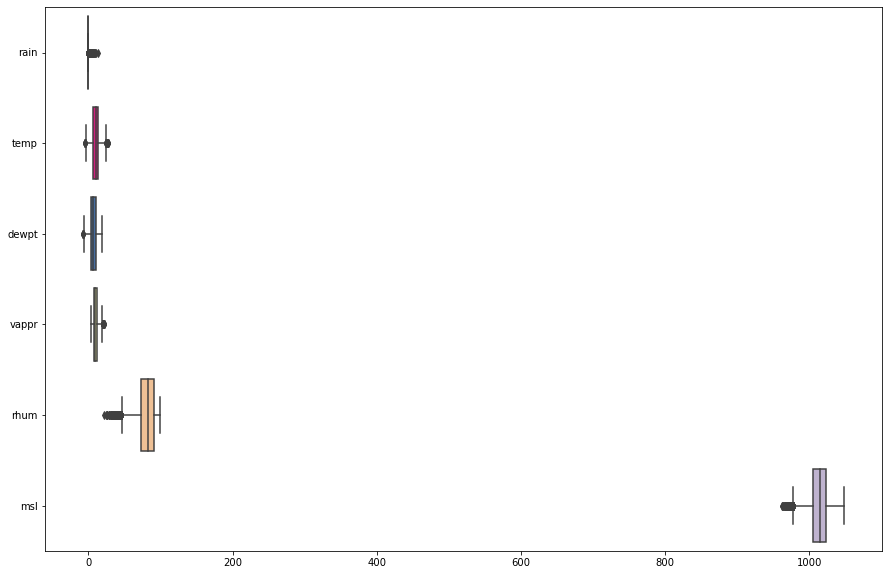

In [20]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=hourlyWeather, orient='h', palette='Accent_r');

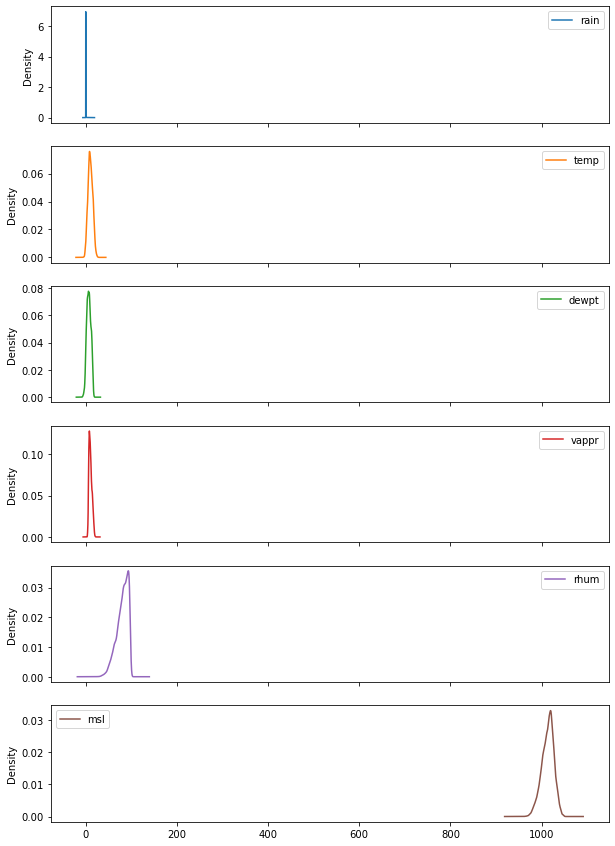

In [21]:
hourlyWeather[weatherCols].plot(kind='density', subplots=True, figsize=(10,15));

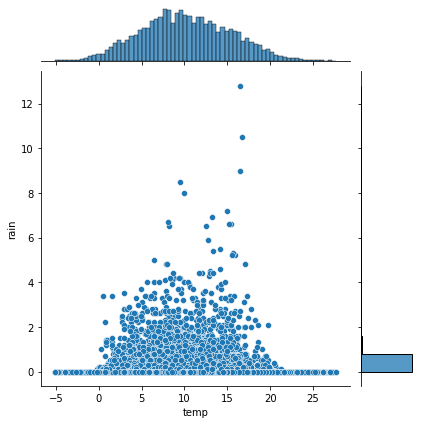

In [22]:
sns.jointplot(data=hourlyWeather[weatherCols], x='temp', y='rain');

### Weather Hour

In [23]:
hourlyWeatherEDA = hourlyWeather.copy()
hourlyWeatherEDA['Hour'] = hourlyWeatherEDA.date.dt.hour
hourlyWeatherEDA['Day of Week'] = hourlyWeatherEDA.date.dt.day_name()
hourlyWeatherEDA['Day'] = hourlyWeatherEDA.date.dt.dayofweek
hourlyWeatherEDA['Season'] = (hourlyWeatherEDA.date.dt.month%12 // 3  + 1)
hourlyWeatherEDA.sort_values('Day', inplace=True)
hourlyWeatherEDA.set_index('date', inplace=True)
hourlyWeatherEDA

,rain,temp,dewpt,vappr,rhum,msl,Hour,Day of Week,Day,Season
date,,,,,,,,,,
2020-12-21 23:00:00,0.00,3.30,2.50,7.30,94.00,1005.80,23,Monday,0,1
2019-06-17 03:00:00,0.00,9.70,8.20,10.90,90.00,1009.80,3,Monday,0,3
2019-06-17 02:00:00,0.10,9.50,8.40,11.00,92.00,1009.80,2,Monday,0,3
2019-06-17 01:00:00,0.00,9.90,8.90,11.40,93.00,1009.60,1,Monday,0,3
2019-06-17 00:00:00,0.00,10.00,9.10,11.60,94.00,1009.50,0,Monday,0,3
...,...,...,...,...,...,...,...,...,...,...
2019-03-03 11:00:00,0.40,5.40,2.80,7.50,83.00,992.90,11,Sunday,6,2
2019-03-03 12:00:00,1.40,4.70,2.80,7.40,87.00,991.10,12,Sunday,6,2
2019-03-03 13:00:00,2.20,3.80,2.20,7.20,89.00,988.90,13,Sunday,6,2


In [24]:
weatherHour = hourlyWeatherEDA.groupby(by='Hour').agg({'rain': 'sum', 'temp': 'mean',
                                         'dewpt': 'mean','vappr':'mean',
                                         'rhum':'mean', 'msl':'mean'})
weatherHour

,rain,temp,dewpt,vappr,rhum,msl
Hour,,,,,,
0,95.60,8.67,6.54,10.12,86.38,1013.67
1,95.10,8.53,6.50,10.09,86.98,1013.53
2,96.20,8.37,6.42,10.04,87.47,1013.38
3,110.30,8.20,6.35,9.99,87.96,1013.25
4,102.90,8.09,6.29,9.94,88.28,1013.12
5,117.10,8.09,6.32,9.97,88.50,1013.11
6,113.40,8.30,6.49,10.10,88.24,1013.18
7,104.10,8.84,6.71,10.26,86.56,1013.30
8,93.70,9.52,6.89,10.39,83.94,1013.46


In [25]:
weatherHour.describe()

,rain,temp,dewpt,vappr,rhum,msl
count,24.00,24.00,24.00,24.00,24.00,24.00
mean,98.50,10.21,6.85,10.35,80.42,1013.39
std,15.36,1.74,0.35,0.25,6.93,0.23
min,63.10,8.09,6.29,9.94,69.60,1013.04
25%,94.75,8.64,6.53,10.12,73.69,1013.20
50%,98.60,9.80,6.88,10.38,82.04,1013.38
75%,106.05,11.94,7.17,10.58,86.66,1013.60
max,130.60,12.90,7.30,10.67,88.50,1013.71


### Weather Seasons

In [26]:
seasonDay = hourlyWeatherEDA.groupby(by=['Season','Hour']).agg({'rain': 'sum', 'temp': 'mean',
                                         'dewpt': 'mean','vappr':'mean',
                                         'rhum':'mean', 'msl':'mean'})
seasonDay.reset_index(inplace=True)
seasonDay.index= seasonDay.Hour

seasonDay.Season = seasonDay.Season.map({1:'Winter',2:'Spring', 3:'Summer', 4:'Autumn'})
seasonDay

,Season,Hour,rain,temp,dewpt,vappr,rhum,msl
Hour,,,,,,,,
0,Winter,0,25.00,5.57,3.32,7.94,85.42,1011.50
1,Winter,1,26.30,5.52,3.30,7.93,85.61,1011.35
2,Winter,2,36.60,5.47,3.23,7.90,85.58,1011.16
3,Winter,3,40.90,5.38,3.19,7.87,85.82,1011.09
4,Winter,4,37.60,5.32,3.15,7.85,85.94,1010.90
5,Winter,5,40.70,5.36,3.21,7.87,85.98,1010.79
6,Winter,6,41.40,5.32,3.24,7.89,86.37,1010.76
7,Winter,7,35.50,5.35,3.29,7.92,86.54,1010.81
8,Winter,8,34.00,5.41,3.33,7.95,86.53,1010.97


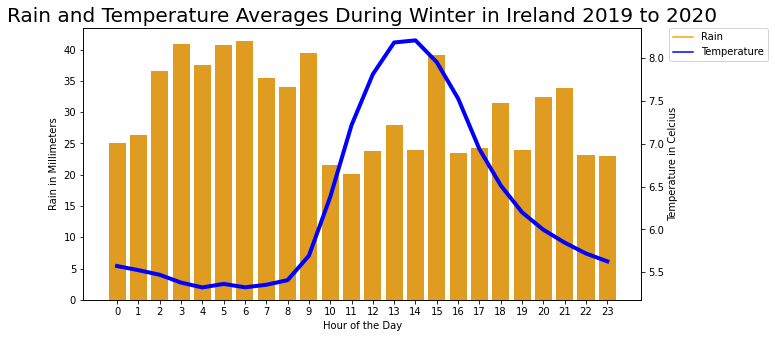

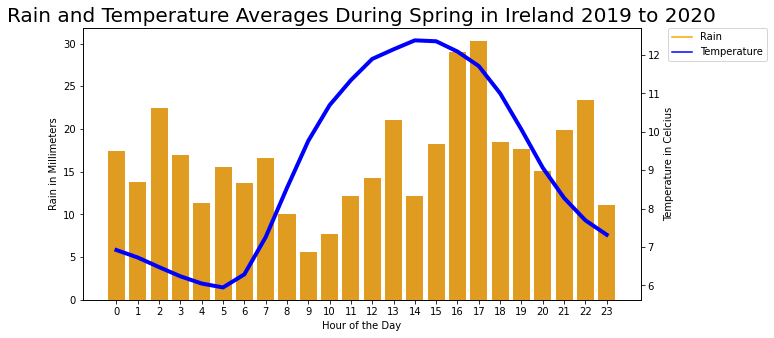

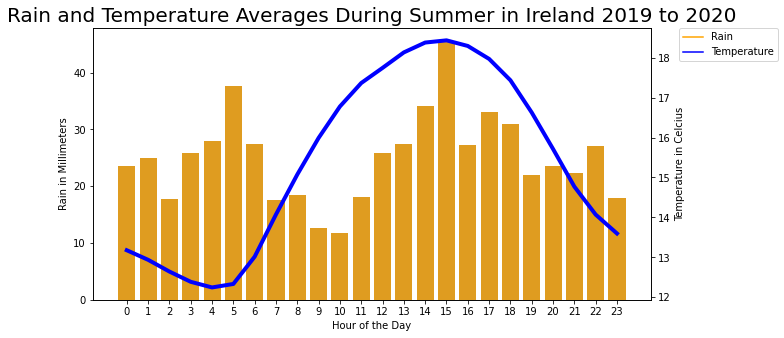

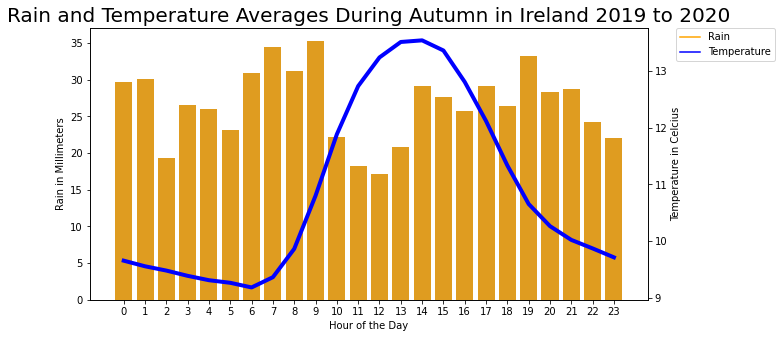

In [27]:
seasons = ['Winter', 'Spring', 'Summer', 'Autumn']
#https://stackoverflow.com/questions/47591650/second-y-axis-time-series-seaborn
from matplotlib.lines import Line2D

for sea in seasons:
    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1 = sns.barplot(x='Hour', y='rain', 
        data= seasonDay[['rain','Hour']][seasonDay.Season == sea], color='orange')
    ax1.set(xlabel='Hour of the Day', ylabel='Rain in Millimeters')
    ax1.grid(False)
    ax2 = ax1.twinx()
    sns.lineplot(x='Hour', y='temp', 
        data=seasonDay[['temp','Hour']][seasonDay.Season == sea], ax=ax2,
                linewidth=4, color='blue')
    # https://www.programcreek.com/python/example/96215/seaborn.set
    ax2.set(ylabel='Temperature in Celcius')
    plt.title(label= 'Rain and Temperature Averages During '+ sea+' in Ireland 2019 to 2020', 
              fontsize=20)
    plt.legend(handles=[Line2D([], [], color="orange", label='Rain'), 
                        Line2D([], [], color="blue", label='Temperature')], fontsize=10,
              bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    
    plt.show();

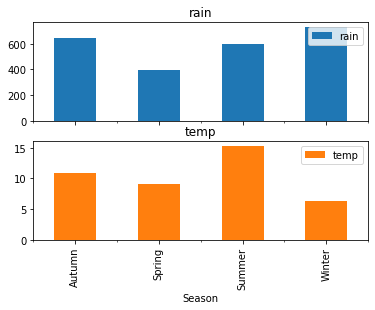

In [28]:
seasonDayAverages = seasonDay.groupby('Season').agg({'rain':'sum','temp':'mean'})
seasonDayAverages.sort_index(level=seasons)
seasonDayAverages.plot(kind='bar', subplots=True)
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

## Pedestrian

### Cleaning Pedestrian Data

In [29]:
# Pedestrian Counts
# 2019 Counts
pedCount2019 = pedCount2019.resample('60min', on='Time').sum()
pedCount2019.reset_index(inplace=True)
pedCount2019.rename(columns={'Time':'date'}, inplace=True)

# 2020 Counts
pedCount2020.rename(columns={'Date & Time':'date'}, inplace=True)

# 2021 Counts
pedCount2021.rename(columns={'Date and Time':'date'}, inplace=True)

In [30]:
# Convert object to datetime
pedCount2019.date = pd.to_datetime(pedCount2019.date)
pedCount2020.date = pd.to_datetime(pedCount2020.date)
pedCount2021.date = pd.to_datetime(pedCount2021.date)

In [31]:
# Merge two datasets into one
pedCount= pd.concat([pedCount2019, pedCount2020])
pedCount.reset_index(drop=True, inplace=True)
pedCount

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Dawson Street,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Capel Street - Removed from site 20/10,Dame Street (Counter Missing)
0,2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,255.00,881.00,1988.00,140.00,0.00,0.00,0.00,NaN,NaN
1,2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,209.00,723.00,1270.00,215.00,0.00,0.00,0.00,NaN,NaN
2,2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,193.00,1010.00,1589.00,210.00,0.00,0.00,0.00,NaN,NaN
3,2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,178.00,772.00,1534.00,204.00,0.00,0.00,0.00,NaN,NaN
4,2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,35.00,197.00,610.00,88.00,0.00,0.00,0.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,NaN,194.00,296.00,136.00,204.00,123.00,97.00,NaN,NaN
17540,2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,NaN,153.00,274.00,85.00,91.00,64.00,59.00,NaN,NaN
17541,2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,NaN,86.00,288.00,94.00,85.00,71.00,48.00,NaN,NaN
17542,2020-12-31 22:00:00,149.00,142.00,NaN,NaN,162.00,179.00,478.00,886.00,120.00,NaN,1024.00,92.00,10.00,139.00,213.00,35.00,NaN,66.00,168.00,82.00,44.00,62.00,35.00,NaN,NaN


In [32]:
pedCount.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17544 entries, 0 to 17543
Data columns (total 26 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   date                                             17544 non-null  datetime64[ns]
 1   O'Connell St Outside Pennys                      17543 non-null  float64       
 2   O'Connell St Outside Clerys                      17543 non-null  float64       
 3   Mary Street                                      12191 non-null  float64       
 4   Capel Street                                     8760 non-null   float64       
 5   Aston Quay                                       17543 non-null  float64       
 6   Grafton Street @ CompuB                          17543 non-null  float64       
 7   Talbot Street North                              17543 non-null  float64       
 8   Doilier Street, Burgh Quay          

In [33]:
# Sort values to ensure date in time are in order
pedCount.sort_values('date',inplace=True)
pedCount

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Dawson Street,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Capel Street - Removed from site 20/10,Dame Street (Counter Missing)
0,2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,255.00,881.00,1988.00,140.00,0.00,0.00,0.00,NaN,NaN
1,2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,209.00,723.00,1270.00,215.00,0.00,0.00,0.00,NaN,NaN
2,2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,193.00,1010.00,1589.00,210.00,0.00,0.00,0.00,NaN,NaN
3,2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,178.00,772.00,1534.00,204.00,0.00,0.00,0.00,NaN,NaN
4,2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,35.00,197.00,610.00,88.00,0.00,0.00,0.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,NaN,194.00,296.00,136.00,204.00,123.00,97.00,NaN,NaN
17540,2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,NaN,153.00,274.00,85.00,91.00,64.00,59.00,NaN,NaN
17541,2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,NaN,86.00,288.00,94.00,85.00,71.00,48.00,NaN,NaN
17542,2020-12-31 22:00:00,149.00,142.00,NaN,NaN,162.00,179.00,478.00,886.00,120.00,NaN,1024.00,92.00,10.00,139.00,213.00,35.00,NaN,66.00,168.00,82.00,44.00,62.00,35.00,NaN,NaN


In [34]:
# Drop the columns that no longer have counters and Mary Street that has loads of Na's almost all of 2020
pedCount.drop(columns=['Dame Street (Counter Missing)', 
                     'Capel Street - Removed from site 20/10',
                    'Dawson Street'],inplace=True)

In [35]:
# Had to rename columns to match previous years dataset
pedCount2021.rename(columns={'Date and Time':'date', 
                             "O\'Connell St/Pennys Pedestrian": "O'Connell St Outside Pennys",
                             "O\'Connell st/Princes st North": "O'Connell St Outside Clerys",
                             "Aston Quay/Fitzgeralds": 'Aston Quay',
                             'Grafton Street/CompuB': 'Grafton Street @ CompuB',
                             "Talbot st/Murrays Pharmacy": 'Talbot Street North',
                             "D\'olier st/Burgh Quay": 'Doilier Street, Burgh Quay',
                             "Dawson Street/Molesworth": 'Dawson Street Replacement',
                             "Talbot st/Guineys": 'Talbot Street South',
                             "O\'Connell St/Parnell St/AIB": "O'Connell St, Parnell St @ AIB",
                             "Grafton Street / Nassau Street / Suffolk Street": 'Grafton Street / Nassau Street / Suffolk Street',
                             "College Green/Bank Of Ireland": 'College Green, Bank Of Ireland',
                             "Henry Street/Coles Lane/Dunnes": 'Henry Street',
                             "Westmoreland Street East/Fleet street": 'Westmoreland Street East',
                             "Liffey st/Halfpenny Bridge": 'Liffey Street',
                             "Westmoreland Street West/Carrolls":'Westmoreland Street West',
                             "Grafton st/Monsoon":'Grafton Street', 
                             "Bachelors walk/Bachelors way":'Bachelors Walk',
                             "College Green/Church Lane":'College Green @ Church Lane',
                             "College st/Westmoreland st": 'College Green - Dame St Side',
                             "Capel st/Mary street": 'Capel Street',
                             'Dame Street/Londis': 'Dame Street',
                             'Mary st/Jervis st': 'Mary Street'
                            }, inplace=True)

# Filter out only columns from previous year's dataset
pedCount2021 = pedCount2021[pedCount.columns.values]
pedCount2021.sort_values('date',inplace=True)
pedCount2021.reset_index(drop=True, inplace=True)
pedCount2021

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side
0,2021-01-01 00:00:00,137.00,125.00,NaN,NaN,165.00,111.00,525.00,793.00,45.00,NaN,375.00,85.00,9.00,163.00,227.00,33.00,43.00,220.00,94.00,66.00,52.00,27.00
1,2021-01-01 01:00:00,53.00,51.00,NaN,NaN,25.00,42.00,1204.00,448.00,10.00,NaN,137.00,29.00,2.00,66.00,64.00,22.00,28.00,112.00,26.00,18.00,12.00,18.00
2,2021-01-01 02:00:00,49.00,38.00,NaN,NaN,27.00,25.00,1837.00,262.00,8.00,NaN,210.00,28.00,4.00,40.00,52.00,17.00,32.00,44.00,24.00,11.00,14.00,6.00
3,2021-01-01 03:00:00,30.00,12.00,NaN,NaN,16.00,15.00,2996.00,88.00,6.00,NaN,73.00,24.00,2.00,39.00,14.00,10.00,18.00,15.00,15.00,4.00,7.00,8.00
4,2021-01-01 04:00:00,24.00,12.00,NaN,NaN,16.00,17.00,3621.00,40.00,11.00,NaN,86.00,18.00,0.00,14.00,24.00,2.00,12.00,23.00,0.00,10.00,5.00,6.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2021-12-31 19:00:00,NaN,807.00,435.00,2301.00,NaN,832.00,0.00,736.00,145.00,1170.00,1347.00,600.00,139.00,1282.00,1123.00,153.00,NaN,1403.00,2394.00,893.00,504.00,239.00
8756,2021-12-31 20:00:00,NaN,884.00,257.00,1695.00,NaN,740.00,0.00,784.00,184.00,1064.00,1468.00,503.00,144.00,1611.00,925.00,213.00,NaN,1353.00,1898.00,964.00,628.00,287.00
8757,2021-12-31 21:00:00,NaN,513.00,108.00,1666.00,NaN,413.00,0.00,499.00,75.00,863.00,1330.00,269.00,87.00,1253.00,524.00,132.00,NaN,716.00,1491.00,945.00,319.00,168.00
8758,2021-12-31 22:00:00,NaN,385.00,109.00,1279.00,NaN,344.00,0.00,357.00,43.00,668.00,1522.00,181.00,53.00,841.00,1401.00,86.00,NaN,543.00,1428.00,690.00,225.00,106.00


In [36]:
# Count missing values... some counters are not there from 2019 to 2020
pedCount.isna().sum() / len(pedCount) * 100

date                                               0.00
O'Connell St Outside Pennys                        0.01
O'Connell St Outside Clerys                        0.01
Mary Street                                       30.51
Capel Street                                      50.07
Aston Quay                                         0.01
Grafton Street @ CompuB                            0.01
Talbot Street North                                0.01
Doilier Street, Burgh Quay                         0.01
Dawson Street Replacement                          0.01
Dame Street                                       50.07
Talbot Street South                                0.01
O'Connell St, Parnell St @ AIB                     0.01
Grafton Street / Nassau Street / Suffolk Street    0.01
College Green, Bank Of Ireland                     0.01
Henry Street                                       4.86
Westmoreland Street East                           0.01
Liffey Street                                   

In [37]:
zeroCount(pedCount)

date                                               0.00
O'Connell St Outside Pennys                        0.48
O'Connell St Outside Clerys                        0.32
Mary Street                                        0.83
Capel Street                                       0.17
Aston Quay                                         8.12
Grafton Street @ CompuB                            9.84
Talbot Street North                                8.59
Doilier Street, Burgh Quay                         7.98
Dawson Street Replacement                         45.74
Dame Street                                        8.09
Talbot Street South                                8.25
O'Connell St, Parnell St @ AIB                    10.63
Grafton Street / Nassau Street / Suffolk Street    9.46
College Green, Bank Of Ireland                     8.35
Henry Street                                      11.11
Westmoreland Street East                           0.91
Liffey Street                                   

In [38]:
pedCount2021.isna().sum() / len(pedCount2021) * 100

date                                               0.00
O'Connell St Outside Pennys                       58.45
O'Connell St Outside Clerys                        0.01
Mary Street                                       48.77
Capel Street                                      48.77
Aston Quay                                        68.08
Grafton Street @ CompuB                            0.32
Talbot Street North                                4.66
Doilier Street, Burgh Quay                         0.01
Dawson Street Replacement                          0.63
Dame Street                                       48.77
Talbot Street South                                0.01
O'Connell St, Parnell St @ AIB                     0.01
Grafton Street / Nassau Street / Suffolk Street    0.01
College Green, Bank Of Ireland                     0.01
Henry Street                                       0.01
Westmoreland Street East                           0.01
Liffey Street                                   

In [39]:
zeroCount(pedCount2021)

date                                               0.00
O'Connell St Outside Pennys                        1.50
O'Connell St Outside Clerys                        0.06
Mary Street                                        0.22
Capel Street                                       0.21
Aston Quay                                        21.50
Grafton Street @ CompuB                            0.41
Talbot Street North                               11.56
Doilier Street, Burgh Quay                         0.01
Dawson Street Replacement                          4.57
Dame Street                                        0.35
Talbot Street South                                0.00
O'Connell St, Parnell St @ AIB                     0.01
Grafton Street / Nassau Street / Suffolk Street    2.89
College Green, Bank Of Ireland                     0.23
Henry Street                                       0.01
Westmoreland Street East                           0.83
Liffey Street                                   

### Descriptive Statistics

In [40]:
# Checking outliers at 25%,50%,75%,90%,95% and 99%
pedCount.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side
count,17543.00,17543.00,12191.00,8760.00,17543.00,17543.00,17543.00,17543.00,17543.00,8760.00,17543.00,17543.00,17543.00,17543.00,16691.00,17543.00,17543.00,17543.00,12957.00,17444.00,17543.00,17543.00
mean,1040.76,753.10,205.05,256.26,848.45,1346.15,575.25,622.25,70.36,674.33,1316.84,481.61,279.07,534.46,1409.40,362.15,589.60,807.22,1018.98,409.27,508.66,463.86
std,1051.97,667.38,241.40,275.15,887.02,1363.72,1140.82,619.37,107.41,586.75,2164.29,491.04,331.02,536.23,1633.40,368.28,667.36,634.97,1067.10,934.03,557.16,544.79
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,160.00,145.00,18.00,55.00,169.00,165.00,38.00,146.00,0.00,90.00,89.00,47.00,23.00,97.00,86.00,57.00,67.00,224.50,163.00,20.00,44.50,36.00
50%,630.00,558.00,93.00,240.00,627.00,890.00,154.00,512.00,7.00,598.00,898.00,315.00,145.00,371.00,658.00,218.00,319.00,734.00,609.00,106.00,278.00,238.00
75%,1720.00,1292.00,337.50,409.00,1113.00,2343.00,480.00,913.00,117.00,1138.50,1627.00,825.00,412.00,830.00,2432.00,607.00,926.00,1254.00,1579.00,564.00,874.00,741.00
90%,2768.00,1780.80,582.00,530.10,2203.00,3383.00,1724.80,1285.00,220.00,1509.00,2448.80,1303.00,796.00,1334.80,4028.00,923.00,1571.00,1676.80,2773.00,970.00,1432.00,1343.80
95%,3184.00,2009.00,724.50,590.00,2956.70,3870.00,2871.80,1603.90,283.00,1696.00,3004.00,1452.00,997.00,1668.00,4691.50,1088.00,1900.00,1964.00,3215.20,1237.00,1635.00,1609.90
99%,3715.58,2303.00,932.10,690.00,3735.00,4713.48,6189.58,3070.90,459.58,1992.87,13672.18,1636.00,1326.58,2136.00,5832.10,1399.58,2683.16,2442.16,3948.20,6046.82,1941.58,2078.16


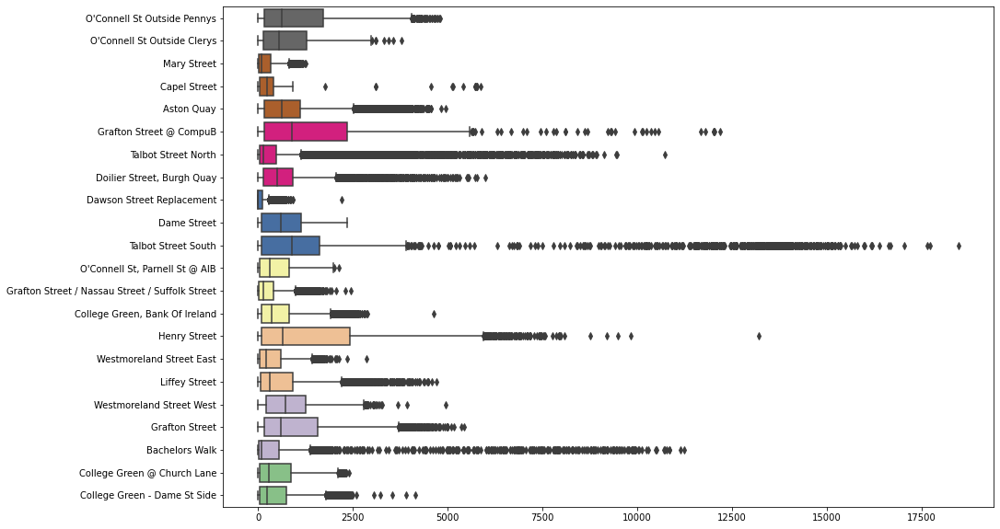

In [41]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=pedCount, orient='h', palette='Accent_r');

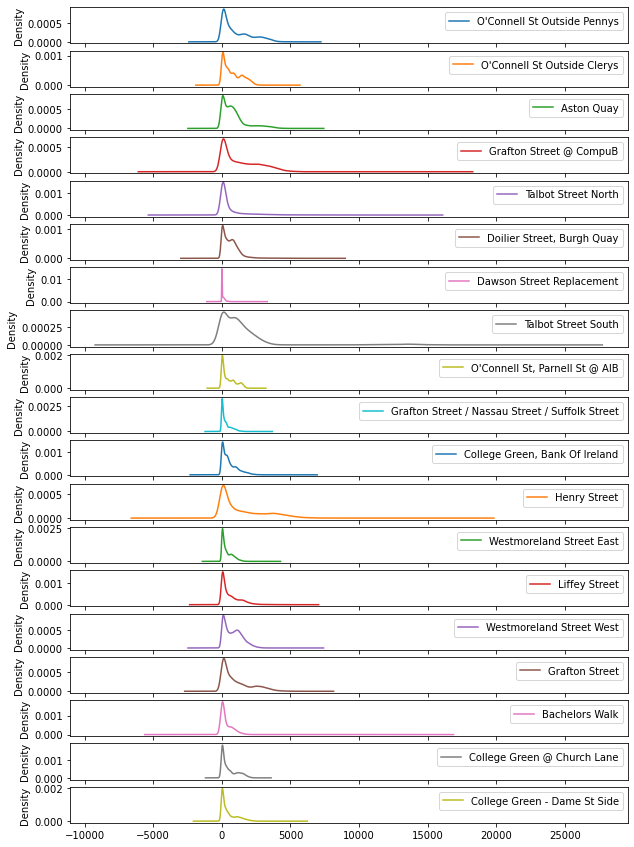

In [42]:
pedCount[pedCols].plot(kind='density', subplots=True, figsize=(10,15));

### Pedestrian Hour

In [43]:
pedCountEDA = pedCount.copy()
pedCountEDA['hour'] = pedCountEDA.date.dt.hour
pedCountEDA['Day of Week'] = pedCountEDA.date.dt.day_name()
pedCountEDA['Day'] = pedCountEDA.date.dt.dayofweek
pedCountEDA.set_index('date', inplace=True)
pedCountEDA.sort_values('Day',inplace=True)
pedCountEDA

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,hour,Day of Week,Day
date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-05-18 18:00:00,422.00,360.00,82.00,NaN,824.00,269.00,851.00,177.00,126.00,NaN,67.00,441.00,112.00,461.00,945.00,101.00,173.00,382.00,175.00,14.00,147.00,145.00,18,Monday,0
2019-04-01 10:00:00,2070.00,1366.00,339.00,327.00,750.00,1252.00,2408.00,801.00,0.00,1045.00,693.00,874.00,536.00,1186.00,2539.00,729.00,2250.00,1107.00,1546.00,962.00,1076.00,1021.00,10,Monday,0
2019-04-01 11:00:00,2361.00,1433.00,397.00,355.00,885.00,1483.00,1985.00,790.00,0.00,1056.00,806.00,1038.00,617.00,1332.00,3114.00,729.00,2256.00,893.00,2171.00,900.00,1069.00,900.00,11,Monday,0
2019-04-01 12:00:00,2881.00,1770.00,709.00,510.00,1111.00,2027.00,2954.00,1039.00,0.00,1241.00,1084.00,1245.00,702.00,1710.00,3920.00,874.00,1559.00,1217.00,3057.00,813.00,1542.00,1245.00,12,Monday,0
2019-04-01 13:00:00,3483.00,1987.00,891.00,664.00,1365.00,2825.00,5190.00,1237.00,0.00,1572.00,1505.00,1508.00,897.00,1890.00,4320.00,1203.00,2305.00,1585.00,3858.00,974.00,1804.00,1525.00,13,Monday,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-17 17:00:00,3139.00,1733.00,717.00,457.00,1799.00,4174.00,179.00,667.00,0.00,1257.00,1531.00,1210.00,528.00,738.00,0.00,737.00,1582.00,2427.00,3183.00,1008.00,1278.00,838.00,17,Sunday,6
2019-11-17 16:00:00,3434.00,1674.00,845.00,509.00,2161.00,4197.00,207.00,595.00,0.00,1519.00,1783.00,1323.00,643.00,838.00,0.00,668.00,1851.00,2594.00,3755.00,919.00,1453.00,918.00,16,Sunday,6
2019-11-17 15:00:00,3524.00,1709.00,833.00,586.00,3061.00,3983.00,200.00,713.00,0.00,1438.00,1496.00,1389.00,712.00,843.00,0.00,699.00,2011.00,2686.00,3975.00,928.00,1411.00,1008.00,15,Sunday,6


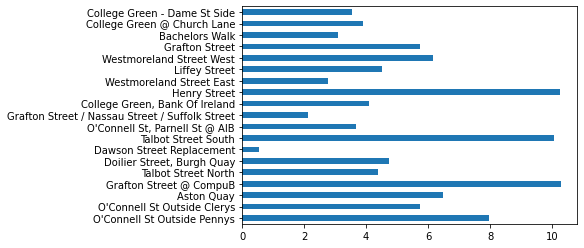

In [44]:
(pedCountEDA[pedCols].sum() / sum(pedCountEDA[pedCols].sum()) * 100).plot.barh();

In [46]:
pedHour = pedCountEDA.groupby(by='hour').mean()
pedHour.drop(columns=['Day'], inplace=True)
pedHour

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side
hour,,,,,,,,,,,,,,,,,,,,,,
0,221.22,199.60,19.89,77.73,525.69,460.23,378.59,475.85,37.08,251.75,1738.78,99.73,73.26,267.71,167.42,153.46,207.92,401.19,325.42,159.04,131.28,105.45
1,151.04,111.82,11.21,65.64,382.57,308.92,232.68,358.00,25.53,207.81,1926.10,58.13,48.09,207.54,106.64,89.87,137.63,290.32,262.67,115.49,79.55,60.95
2,132.77,100.56,8.78,63.18,338.62,241.28,161.77,284.30,21.50,174.60,1802.84,45.33,38.84,174.33,83.74,66.10,109.88,256.35,245.84,81.01,58.94,47.50
3,121.22,77.21,8.35,80.86,258.44,218.19,114.59,196.21,18.29,158.47,1496.66,36.85,32.86,167.58,64.61,55.32,85.22,231.32,237.37,60.55,50.20,33.95
4,71.41,40.21,8.40,59.33,167.59,142.10,90.27,106.73,16.32,66.89,1314.50,25.99,15.48,116.93,59.55,31.32,30.71,96.10,130.16,36.91,21.83,17.12
5,74.82,67.60,12.47,42.33,157.43,159.81,93.40,109.30,21.17,58.51,1205.94,37.87,19.02,102.99,98.74,33.68,27.03,88.84,79.27,37.82,30.82,34.02
6,221.31,291.74,32.33,61.60,443.04,565.79,203.15,365.76,52.83,221.05,1388.92,109.23,74.65,216.70,280.99,102.34,94.06,304.93,188.08,155.70,215.30,146.50
7,402.88,514.95,57.43,91.25,887.29,1170.24,419.53,597.83,61.88,375.48,1799.67,194.64,153.41,303.28,520.80,202.22,205.40,514.86,409.15,342.63,311.19,349.81
8,828.64,848.74,139.60,212.26,964.81,1578.78,649.93,750.02,76.32,634.13,1901.73,391.42,321.05,486.84,983.54,401.24,422.14,811.79,909.27,594.47,594.89,774.43


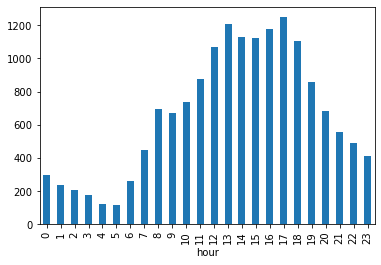

In [47]:
pedHour.mean(axis=1).plot.bar();

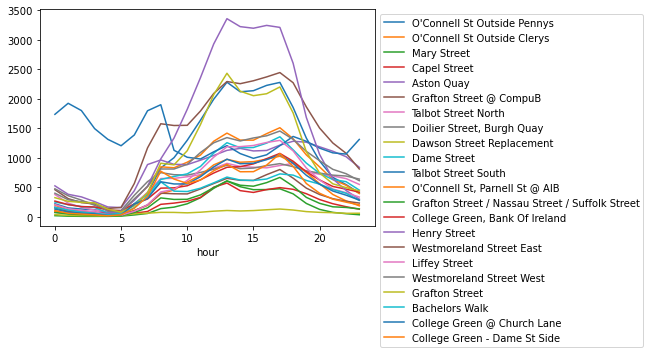

In [48]:
pedHour.plot()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

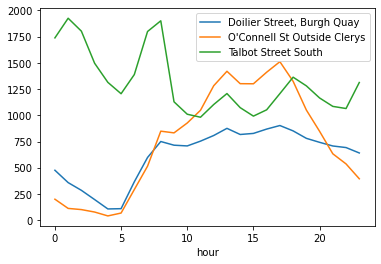

In [49]:
pedHour[['Doilier Street, Burgh Quay',"O'Connell St Outside Clerys",'Talbot Street South']].plot();

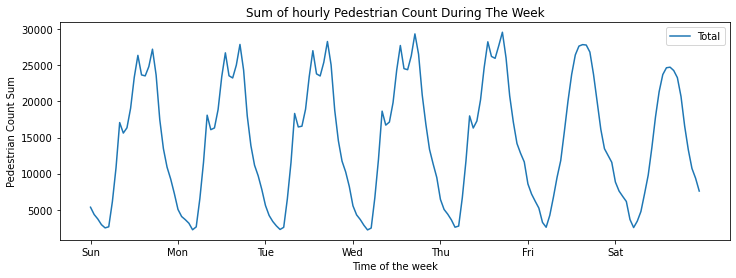

In [50]:
fig, ax = plt.subplots(figsize=(12, 4))

avgWeekPed = pedCountEDA.groupby(['Day', 'hour']).mean()
avgWeekPed.reset_index(inplace=True)
avgWeekPed.drop(columns=['Day','hour'], inplace=True)
avgWeekPed['Total'] = avgWeekPed.sum(axis=1)
avgWeekPed.Total.plot(ax=ax)

_ = ax.set(
    title="Average of hourly Pedestrian Count During The Week",
    xticks=[i * 24 for i in range(7)],
    xticklabels=["Sun", "Mon", "Tue", "Wed", "Thu", "Fri", "Sat"],
    xlabel="Time of the week",
    ylabel="Pedestrian Count Mean",)
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show()

### Pedestrian Day

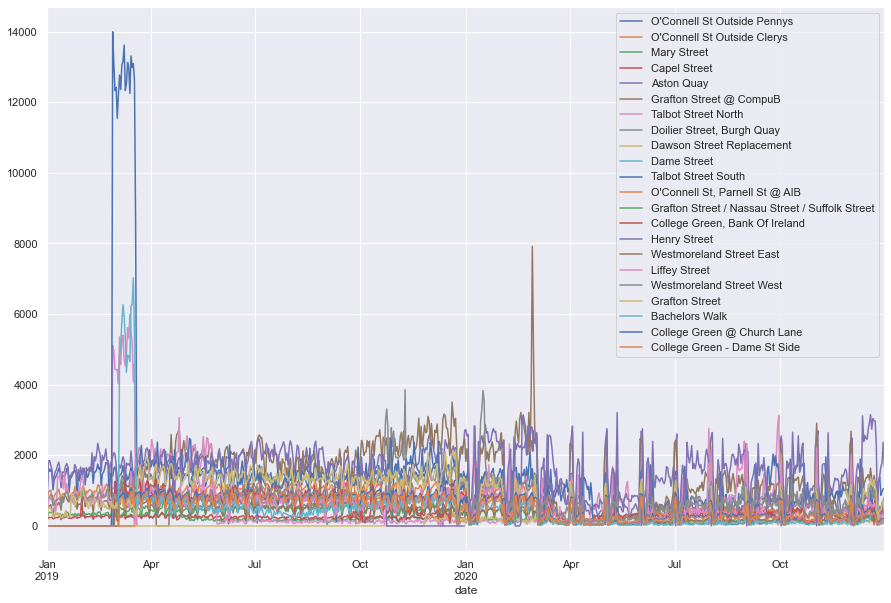

In [110]:
pedCount.resample('D', on='date').mean().plot.line() #Look to add mean instead
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

In [52]:
pedDay = pedCountEDA.groupby(by='Day of Week').mean()
pedDay.sort_values('Day', inplace=True)
pedDay.drop(columns=['hour','Day'], inplace=True)
pedDay['Total'] = pedDay.sum(axis=1)
pedDay['Average'] = pedDay.mean(axis=1)
pedDay

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Total,Average
Day of Week,,,,,,,,,,,,,,,,,,,,,,,,
Monday,1007.70,737.87,198.96,256.85,832.38,1312.01,559.62,607.66,68.71,638.76,1302.31,475.70,270.88,495.70,1339.54,353.73,561.02,765.79,947.09,388.32,489.97,450.31,14060.89,1222.69
Tuesday,1006.71,751.24,198.72,268.33,872.26,1320.44,538.97,605.10,69.73,641.39,1242.25,486.56,285.30,497.39,1394.72,373.26,557.60,783.61,994.40,403.34,509.29,487.96,14288.57,1242.48
Wednesday,1043.06,769.89,195.07,248.07,839.78,1317.29,625.05,641.49,73.09,639.59,1299.13,491.00,283.03,520.06,1486.02,381.23,568.38,776.48,956.20,397.66,509.44,487.80,14548.80,1265.11
Thursday,1118.91,808.26,207.22,266.68,841.55,1436.46,623.90,665.97,77.03,700.04,1301.99,511.66,303.49,544.51,1523.17,392.34,613.09,804.81,1078.22,412.85,541.77,522.72,15296.61,1330.14
Friday,1147.40,834.14,220.18,278.61,886.84,1491.36,638.04,676.73,71.32,767.02,1343.27,517.83,315.95,598.76,1460.39,414.08,654.74,854.15,1103.16,453.22,571.26,534.56,15833.01,1376.78
Saturday,1097.70,748.07,232.03,265.73,869.76,1360.72,550.72,605.49,71.83,751.72,1279.69,478.71,276.18,580.75,1449.54,344.13,635.35,874.36,1112.83,427.73,519.18,423.46,14955.70,1300.50
Sunday,863.31,621.50,182.89,209.34,796.46,1184.40,489.84,552.88,60.76,582.39,1450.31,409.39,218.29,504.41,1211.78,275.68,537.27,791.84,942.22,381.26,419.35,339.15,13024.72,1132.58


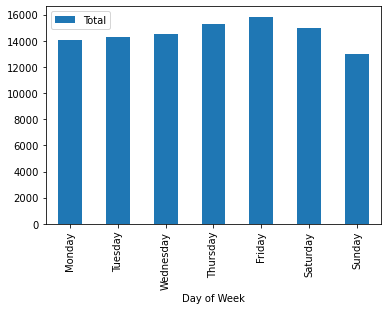

In [53]:
pedDay[['Total']].plot.bar();

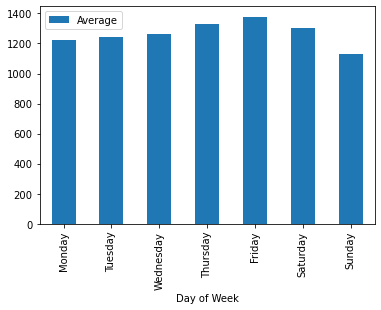

In [54]:
pedDay[['Average']].plot.bar();

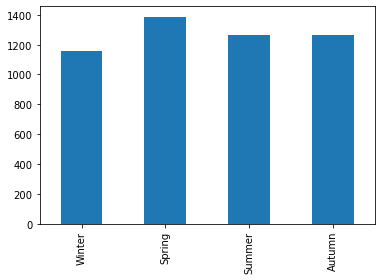

In [55]:
pedCountEDA.reset_index(inplace=True)
pedCountEDA['Season'] = (pedCountEDA.date.dt.month%12 // 3  + 1)

pedDay = pedCountEDA.groupby(by=['Season']).mean()
pedDay.sort_values('Day', inplace=True)
pedDay.drop(columns=['hour','Day'], inplace=True)
pedDay['Total'] = pedDay.sum(axis=1)
pedDay['Average'] = pedDay.mean(axis=1)

pedDay.sort_index(inplace=True)
pedDay.index=seasons

pedDay['Average'].plot.bar();

## Cycle

### Cleaning Cycle Dataset

In [56]:
# convert column name to date
cycleCount2019.rename(columns={'Date and Time':'date'}, inplace=True)
# convert column name to date
cycleCount2020.rename(columns={'Date & Time':'date'}, inplace=True)
# convert column name to date and change street name to match other datasets this column will be deleted
cycleCount2021.rename(columns={'Date & Time':'date',
                              'Drumcondra Cyclists 1' : 'Guild Street'}, inplace=True)

In [57]:
# Convert objects to datetime
cycleCount2019.date = pd.to_datetime(cycleCount2019.date)
cycleCount2020.date = pd.to_datetime(cycleCount2020.date)
cycleCount2021.date = pd.to_datetime(cycleCount2021.date)

# Keep 2019 columns only
cycleCount2020 = cycleCount2020[cycleCount2019.columns]

In [58]:
# Concat dataframes one on top of the other
cycleCount = pd.concat([cycleCount2019, cycleCount2020])

# Reset index
cycleCount.reset_index(drop=True, inplace=True)

# Make sure values are in cronological order
cycleCount.sort_values(by='date', inplace=True)

# Have to drop Guild Street to match 2021 dataset
cycleCount.drop(columns=['Guild Street'])

,date,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall
0,2019-01-01 00:00:00,12.00,4.00,16.00,1.00
1,2019-01-01 01:00:00,17.00,8.00,14.00,1.00
2,2019-01-01 02:00:00,18.00,9.00,9.00,2.00
3,2019-01-01 03:00:00,18.00,5.00,15.00,1.00
4,2019-01-01 04:00:00,12.00,3.00,8.00,1.00
...,...,...,...,...,...
17538,2020-12-31 19:00:00,55.00,9.00,5.00,2.00
17539,2020-12-31 20:00:00,34.00,2.00,11.00,0.00
17540,2020-12-31 21:00:00,22.00,2.00,11.00,3.00
17541,2020-12-31 22:00:00,24.00,7.00,9.00,3.00


In [59]:
cycleCount.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17543 entries, 0 to 17542
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   date                 17543 non-null  datetime64[ns]
 1   Grove Road Totem     17526 non-null  float64       
 2   North Strand Rd S/B  17528 non-null  float64       
 3   North Strand Rd N/B  17528 non-null  float64       
 4   Charleville Mall     17528 non-null  float64       
 5   Guild Street         17527 non-null  float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 959.4 KB


In [60]:
# Count Na's and I am happy with this amount
cycleCount.isna().sum()

date                    0
Grove Road Totem       17
North Strand Rd S/B    15
North Strand Rd N/B    15
Charleville Mall       15
Guild Street           16
dtype: int64

In [61]:
zeroCount(cycleCount)

date                   0.00
Grove Road Totem       0.43
North Strand Rd S/B    3.97
North Strand Rd N/B    1.76
Charleville Mall      16.29
Guild Street           3.81
dtype: float64


In [62]:
# Keep columns in previous year's dataset
cycleCount2021 = cycleCount2021[cycleCount.columns]
#cycleCount2021 = cycleCount.resample('60min', on='date').sum()
cycleCount2021.sort_values('date',inplace=True)
cycleCount2021.reset_index(drop=True, inplace=True)

In [63]:
cycleCount2021.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   date                 8760 non-null   datetime64[ns]
 1   Grove Road Totem     8759 non-null   float64       
 2   North Strand Rd S/B  8749 non-null   float64       
 3   North Strand Rd N/B  8749 non-null   float64       
 4   Charleville Mall     8754 non-null   float64       
 5   Guild Street         8749 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 410.8 KB


In [64]:
# Count Na's and I am happy with this amount
cycleCount2021.isna().sum()

date                    0
Grove Road Totem        1
North Strand Rd S/B    11
North Strand Rd N/B    11
Charleville Mall        6
Guild Street           11
dtype: int64

In [65]:
zeroCount(cycleCount2021)

date                   0.00
Grove Road Totem       0.41
North Strand Rd S/B    6.00
North Strand Rd N/B    3.84
Charleville Mall      16.84
Guild Street          34.34
dtype: float64


### Descriptive Statistics

In [66]:
# Checking outliers at 25%,50%,75%,90%,95% and 99%
cycleCount.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street
count,17526.00,17528.00,17528.00,17528.00,17527.00
mean,115.98,42.48,49.56,6.01,47.03
std,147.59,67.60,70.97,7.18,55.42
min,0.00,0.00,0.00,0.00,0.00
25%,25.00,6.00,11.00,1.00,10.00
50%,79.00,25.00,29.00,4.00,32.00
75%,134.00,50.00,57.00,8.00,58.00
90%,265.00,83.00,103.00,14.00,119.00
95%,417.00,154.00,174.00,19.00,159.00
99%,851.00,408.73,401.00,37.00,292.00


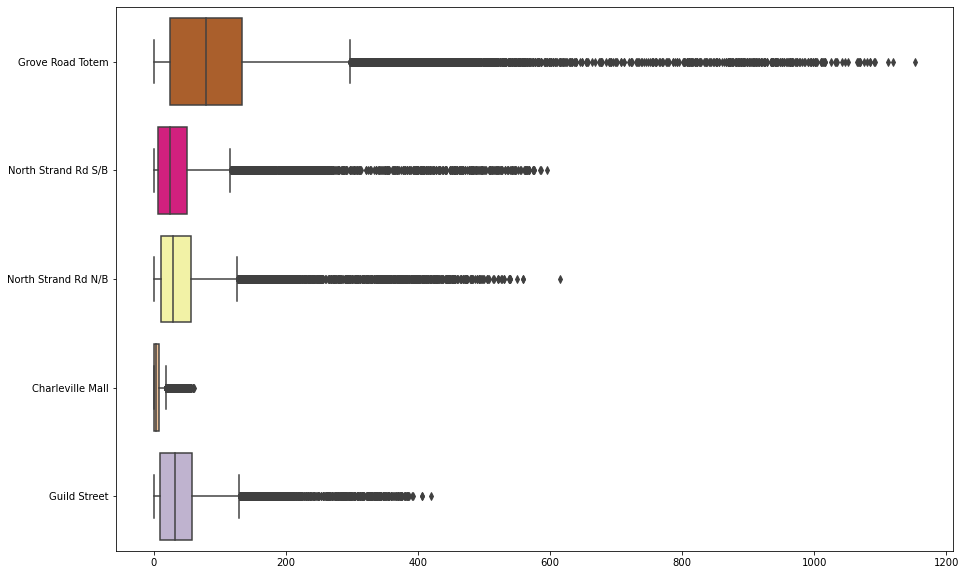

In [67]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=cycleCount, orient='h', palette='Accent_r');

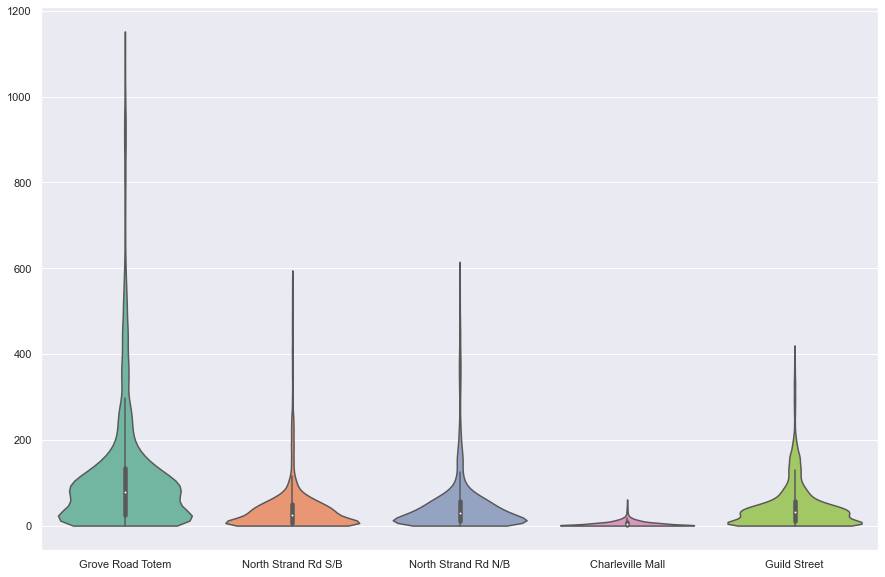

In [68]:
sns.set(rc={'figure.figsize':(15,10)})
sns.violinplot(data=cycleCount, scale='width', palette='Set2', #orient='h',
              cut=0);# Cut at my domain no negative count

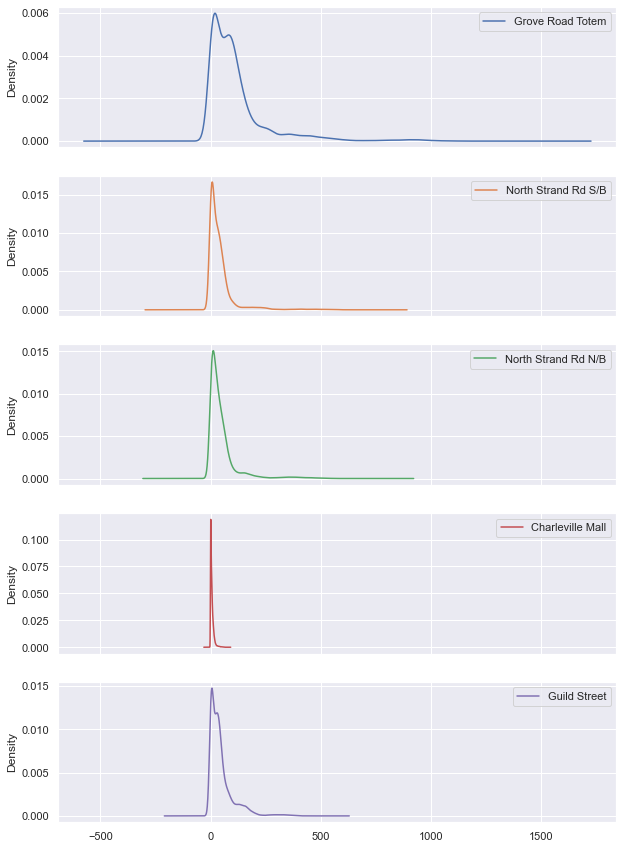

In [69]:
cycleCount[cycleCols].plot(kind='density', subplots=True, figsize=(10,15));

### Cycle Hour

In [70]:
cycleCountEDA = cycleCount.copy()
cycleCountEDA['hour'] = cycleCountEDA.date.dt.hour
cycleCountEDA['Day of Week'] = cycleCountEDA.date.dt.day_name()
cycleCountEDA['Day'] = cycleCountEDA.date.dt.dayofweek
cycleCountEDA.set_index('date', inplace=True)
cycleCountEDA.sort_values('Day',inplace=True)
cycleCountEDA

,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,hour,Day of Week,Day
date,,,,,,,,
2020-05-18 18:00:00,165.00,58.00,91.00,2.00,42.00,18,Monday,0
2019-04-01 11:00:00,56.00,35.00,25.00,4.00,28.00,11,Monday,0
2019-04-01 12:00:00,80.00,30.00,31.00,7.00,36.00,12,Monday,0
2019-04-01 13:00:00,71.00,24.00,44.00,4.00,31.00,13,Monday,0
2019-04-01 14:00:00,90.00,33.00,65.00,5.00,35.00,14,Monday,0
...,...,...,...,...,...,...,...,...
2019-11-17 17:00:00,99.00,32.00,37.00,2.00,36.00,17,Sunday,6
2019-11-17 16:00:00,91.00,27.00,43.00,5.00,37.00,16,Sunday,6
2019-11-17 15:00:00,87.00,37.00,40.00,4.00,47.00,15,Sunday,6


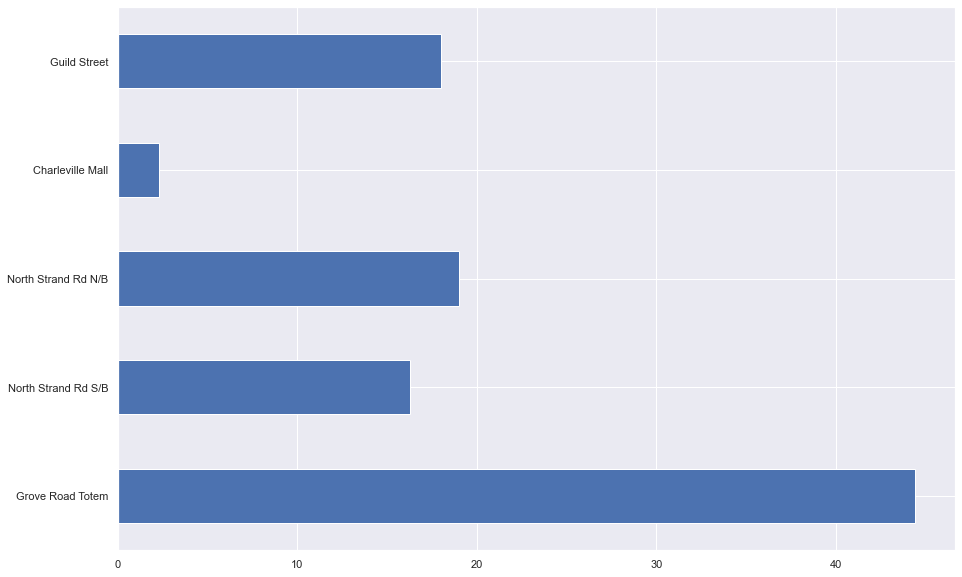

In [71]:
(cycleCountEDA[cycleCols].sum() / sum(cycleCountEDA[cycleCols].sum()) * 100).plot.barh();

In [72]:
cycleHour = cycleCountEDA.groupby(by='hour').mean()
cycleHour.drop(columns=['Day'], inplace=True)

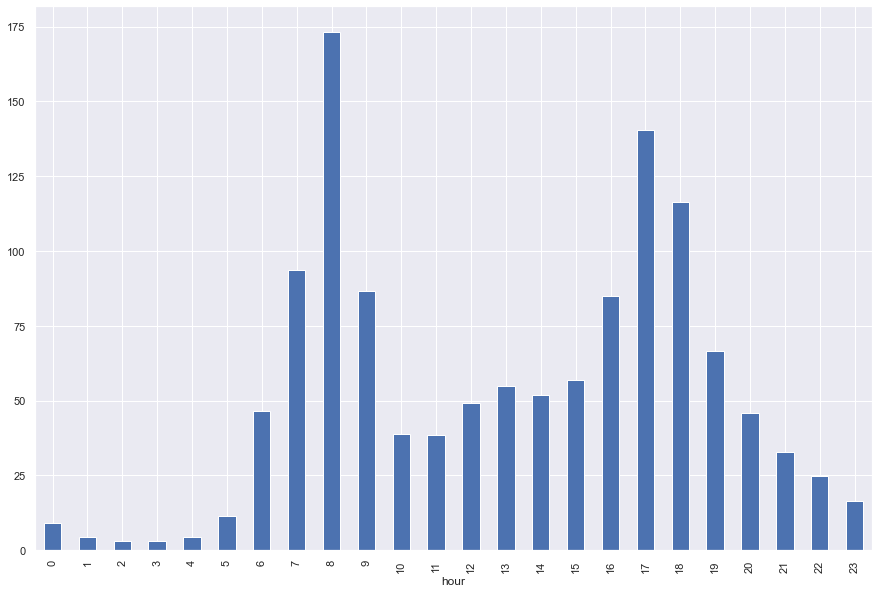

In [73]:
cycleHour.mean(axis=1).plot.bar();

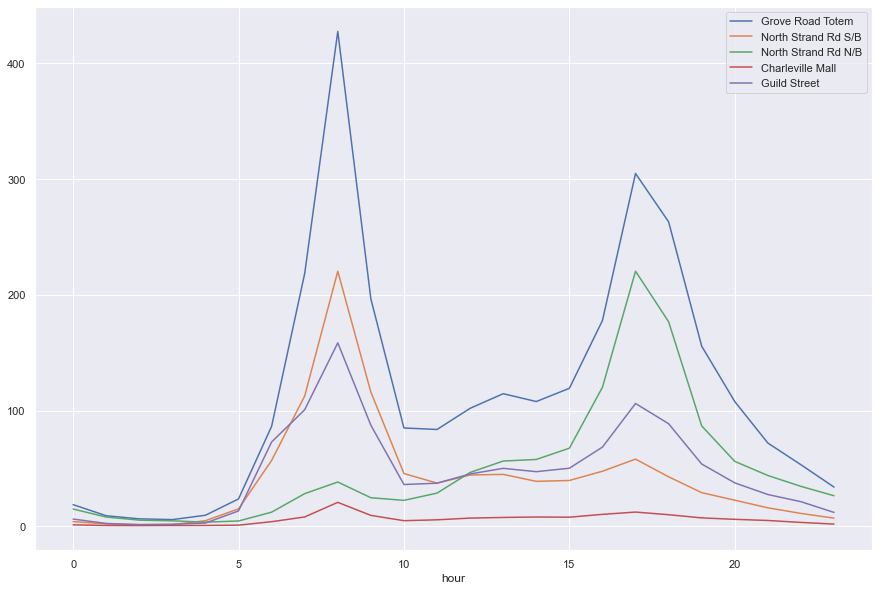

In [74]:
cycleHour.plot()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

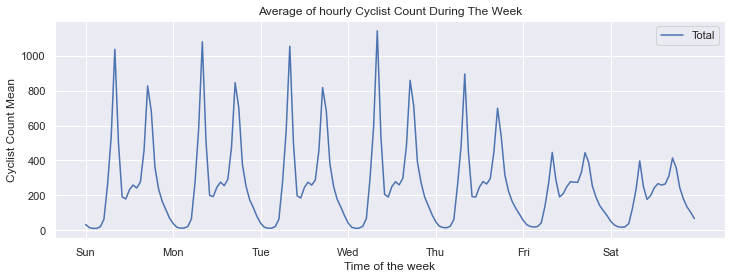

In [75]:
fig, ax = plt.subplots(figsize=(12, 4))

avgWeekCycle = cycleCountEDA.groupby(['Day', 'hour']).mean()
avgWeekCycle.reset_index(inplace=True)
avgWeekCycle.drop(columns=['Day','hour'], inplace=True)
avgWeekCycle['Total'] = avgWeekCycle.sum(axis=1)
avgWeekCycle.Total.plot(ax=ax)

_ = ax.set(
    title="Average of hourly Cyclist Count During The Week",
    xticks=[i * 24 for i in range(7)],
    xticklabels=["Sun", "Mon", "Tue", "Wed", "Thu", "Fri", "Sat"],
    xlabel="Time of the week",
    ylabel="Cyclist Count Mean",)
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show()

### Cycle Day

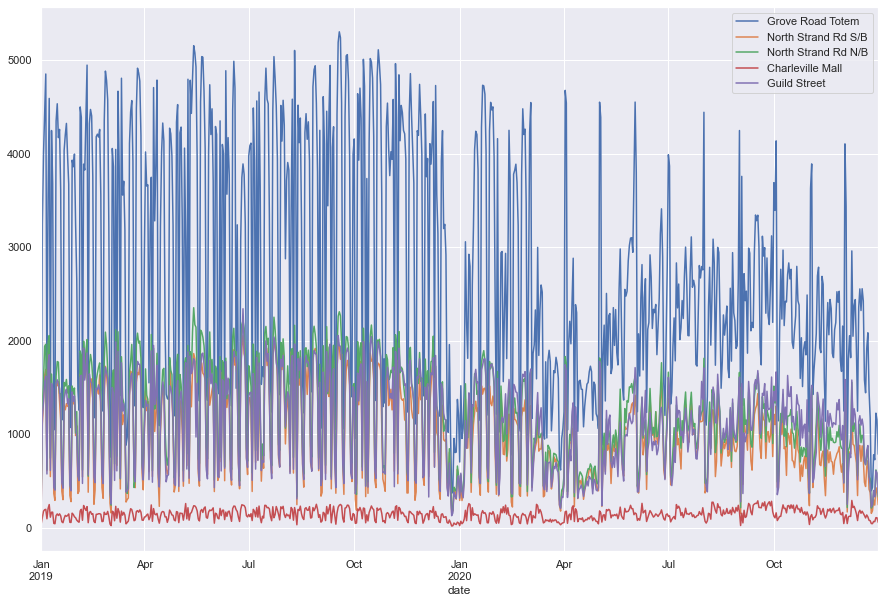

In [109]:
cycleCount.resample('D', on='date').sum().plot.line() #Look to add mean instead
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

In [76]:
cycleDay = cycleCountEDA.groupby(by='Day of Week').mean()
cycleDay.sort_values('Day', inplace=True)
cycleDay.drop(columns=['hour','Day'], inplace=True)
cycleDay['Total'] = cycleDay.sum(axis=1)
cycleDay['Average'] = cycleDay.mean(axis=1)
cycleDay

,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,Total,Average
Day of Week,,,,,,,
Monday,125.91,46.28,53.83,6.27,50.45,282.74,94.25
Tuesday,132.86,47.95,56.23,6.47,52.98,296.50,98.83
Wednesday,130.80,47.55,54.82,6.45,52.55,292.16,97.39
Thursday,138.62,49.68,57.13,6.77,55.05,307.25,102.42
Friday,117.52,43.44,49.88,6.12,48.04,265.00,88.33
Saturday,86.17,32.59,38.93,5.11,35.97,198.77,66.26
Sunday,79.55,29.68,35.90,4.90,34.01,184.03,61.34


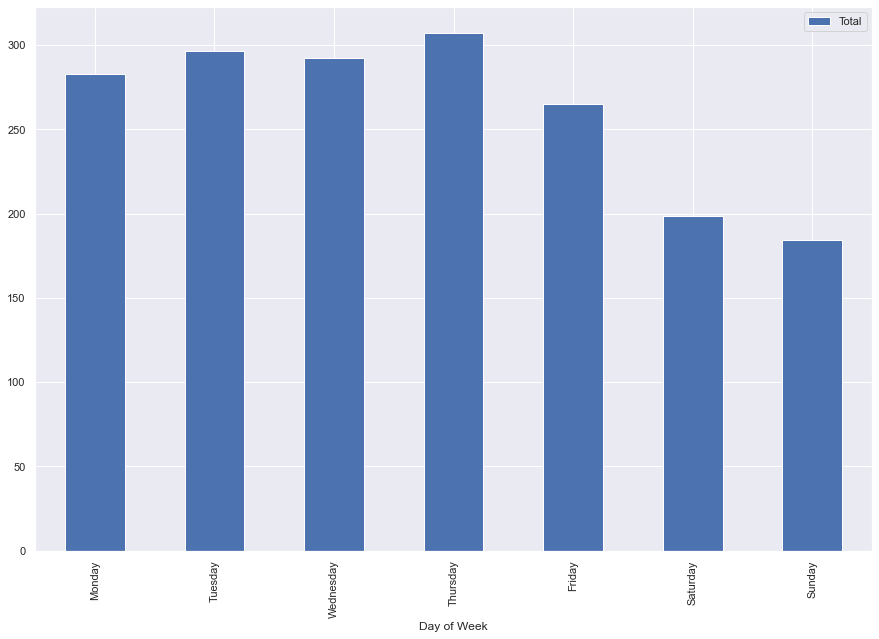

In [77]:
cycleDay[['Total']].plot.bar();

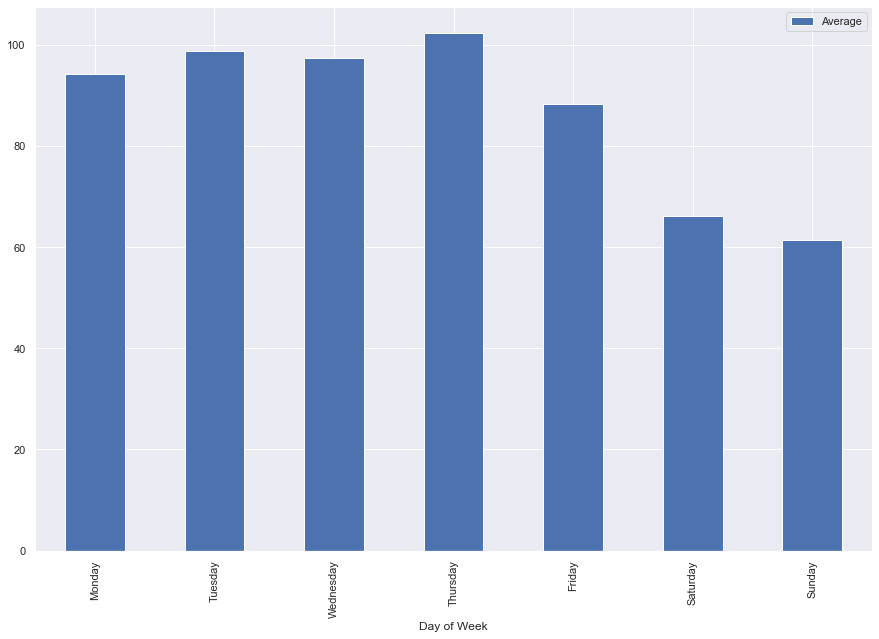

In [78]:
cycleDay[['Average']].plot.bar();

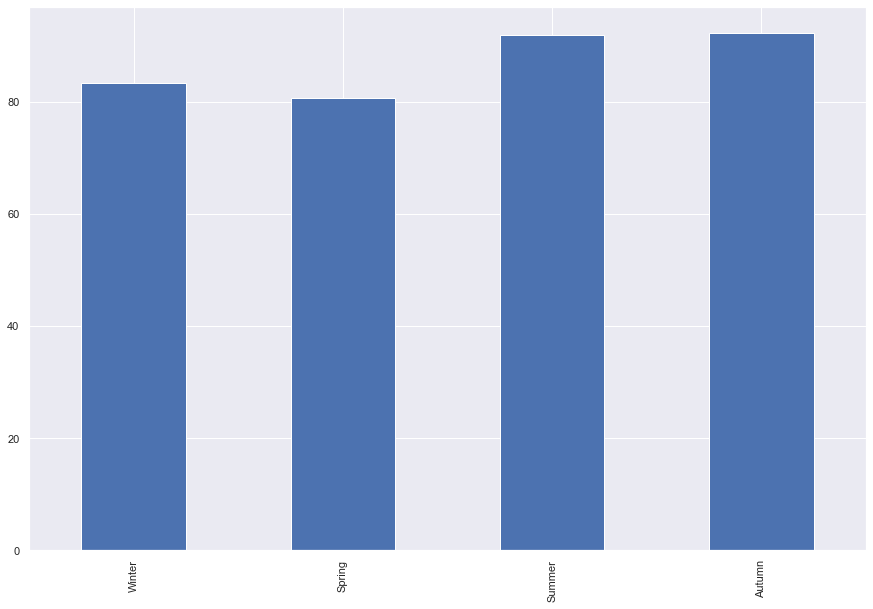

In [80]:
cycleCountEDA.reset_index(inplace=True)
cycleCountEDA['Season'] = (cycleCountEDA.date.dt.month%12 // 3  + 1)

cycleDay = cycleCountEDA.groupby(by=['Season']).mean()
cycleDay.sort_values('Day', inplace=True)
cycleDay.drop(columns=['hour','Day'], inplace=True)
cycleDay['Total'] = cycleDay.sum(axis=1)
cycleDay['Average'] = cycleDay.mean(axis=1)

cycleDay.sort_index(inplace=True)
cycleDay.index=seasons

cycleDay['Average'].plot.bar();

## Correlations

### Weather

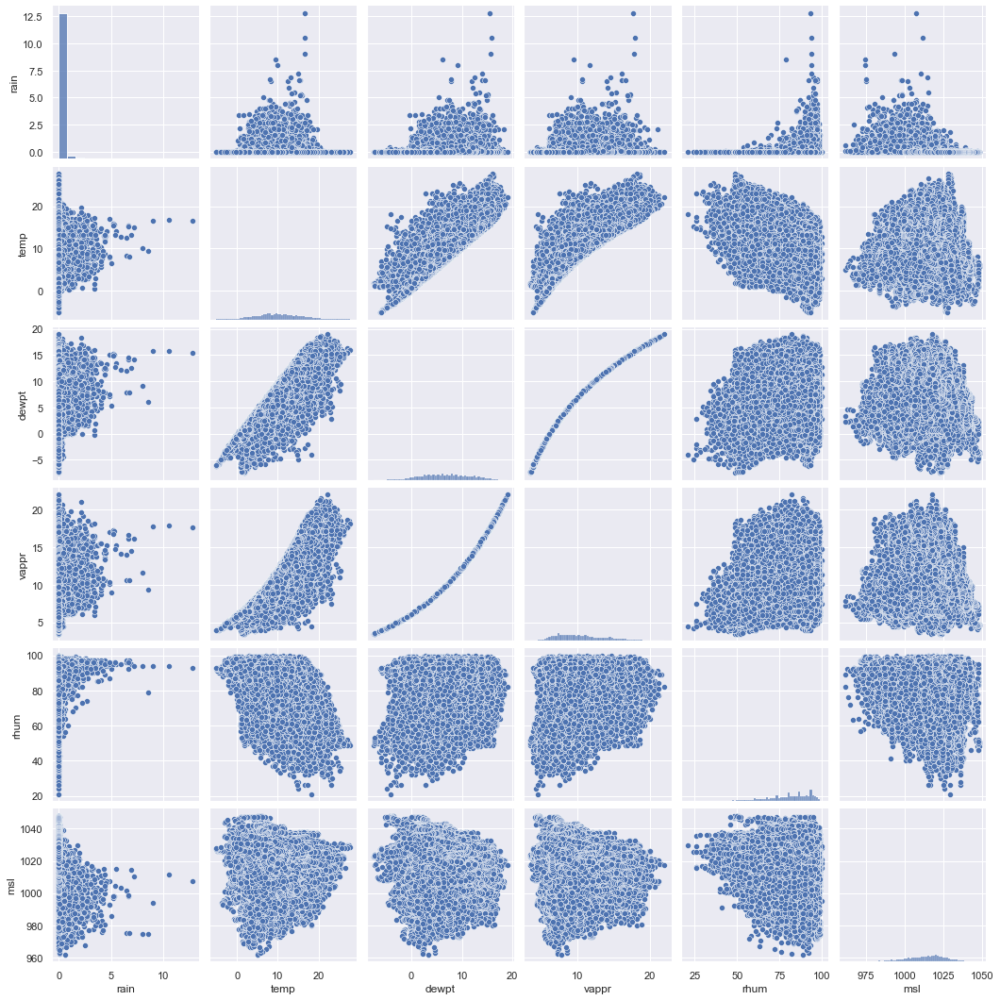

In [81]:
sns.pairplot(data=hourlyWeather);

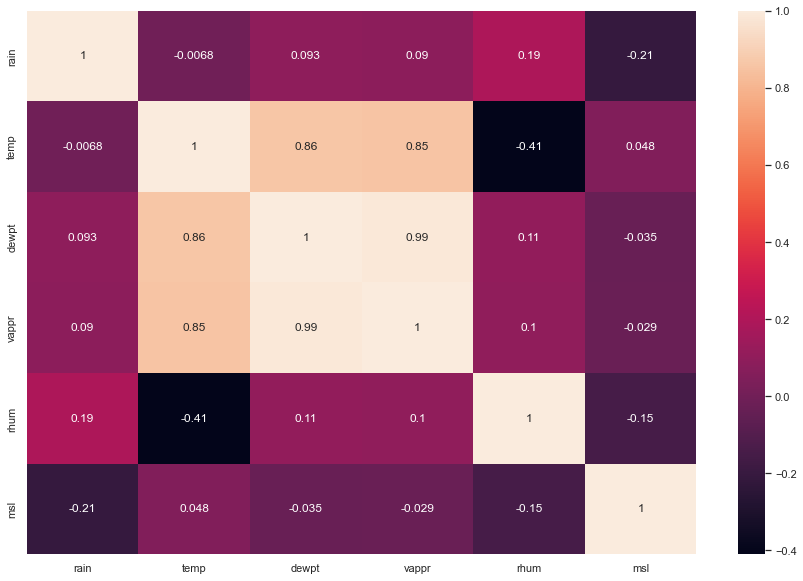

In [82]:
sns.heatmap(hourlyWeather.corr(), annot=True);

### Pedestrian

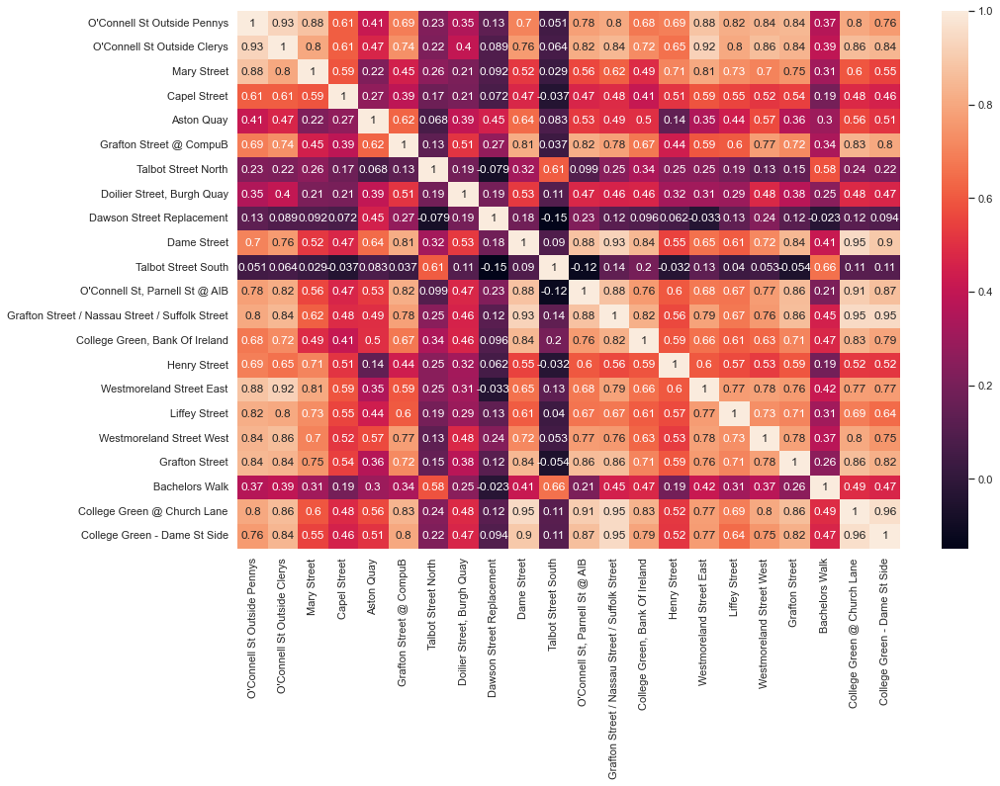

In [83]:
sns.heatmap(pedCount.corr(), annot=True);

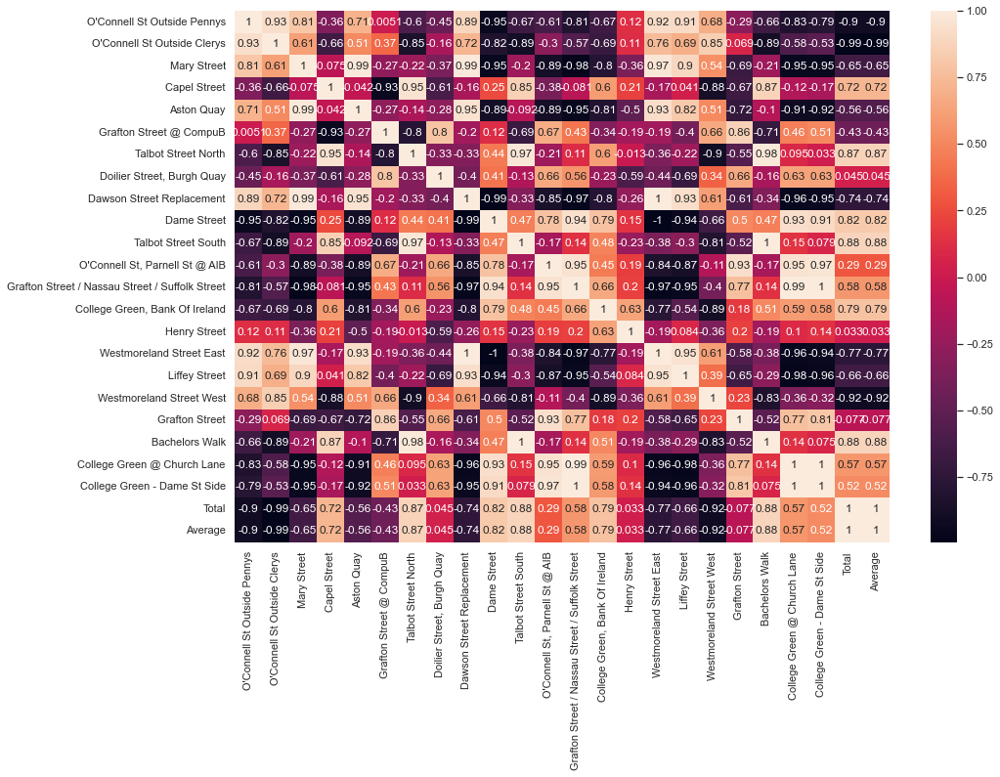

In [84]:
sns.heatmap(pedDay.corr(), annot=True);

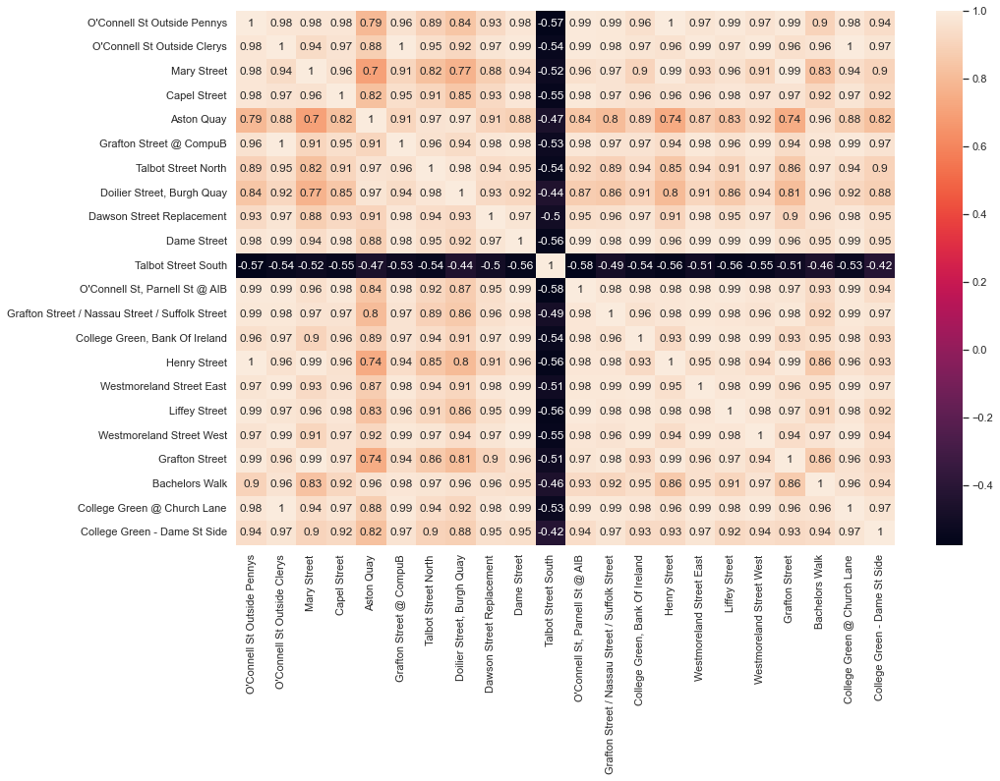

In [85]:
sns.heatmap(pedHour.corr(), annot=True);

### Cycle

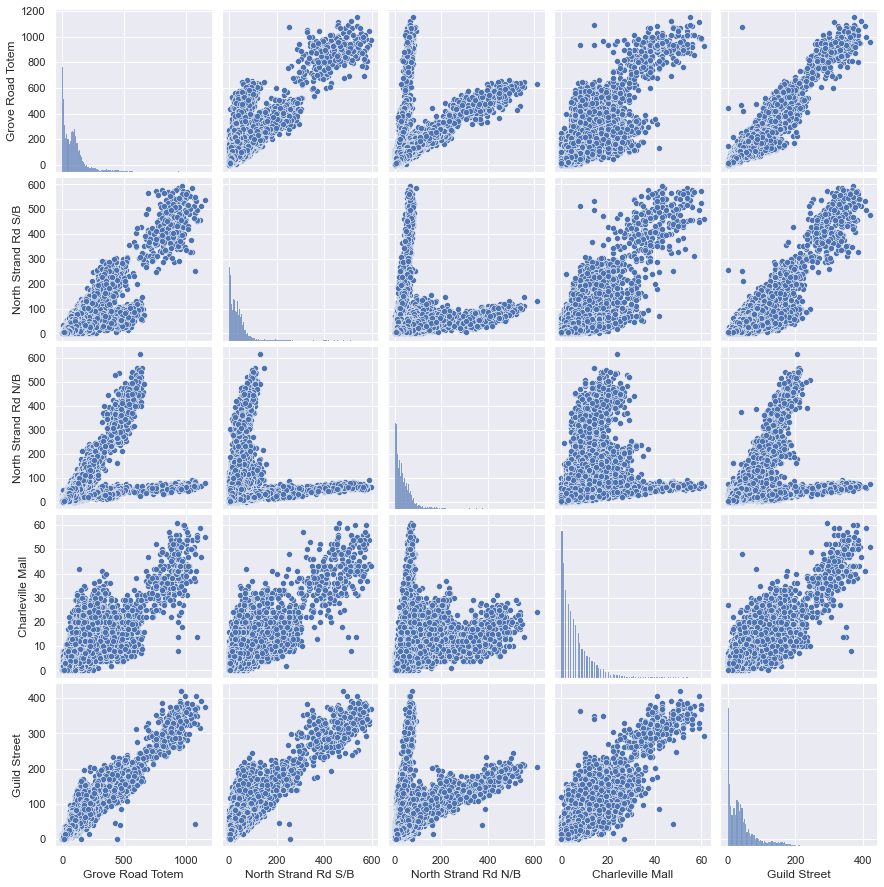

In [86]:
sns.pairplot(data=cycleCount);

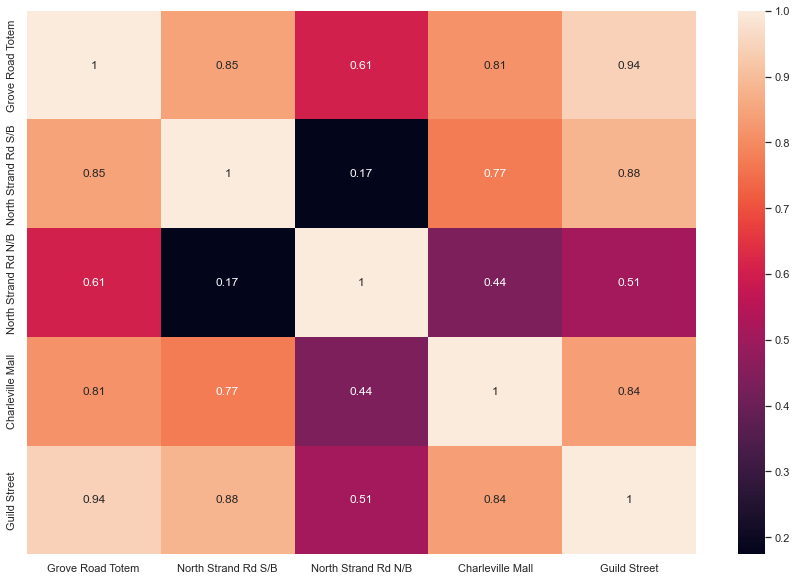

In [87]:
sns.heatmap(cycleCount.corr(), annot=True);

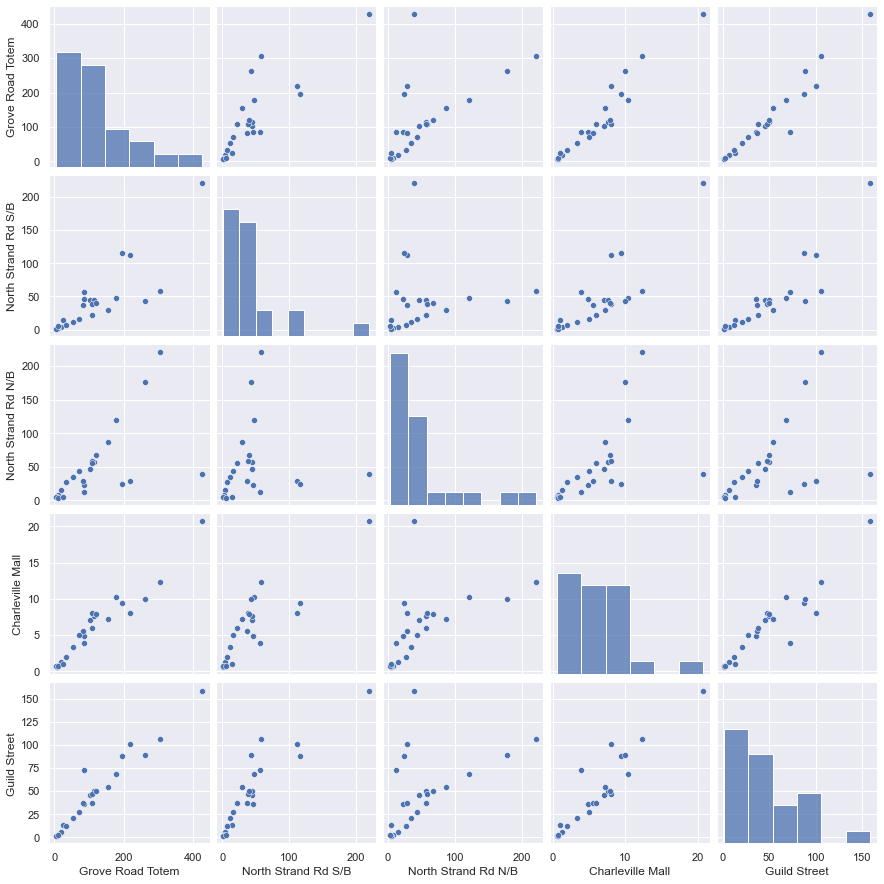

In [88]:
sns.pairplot(data=cycleHour);

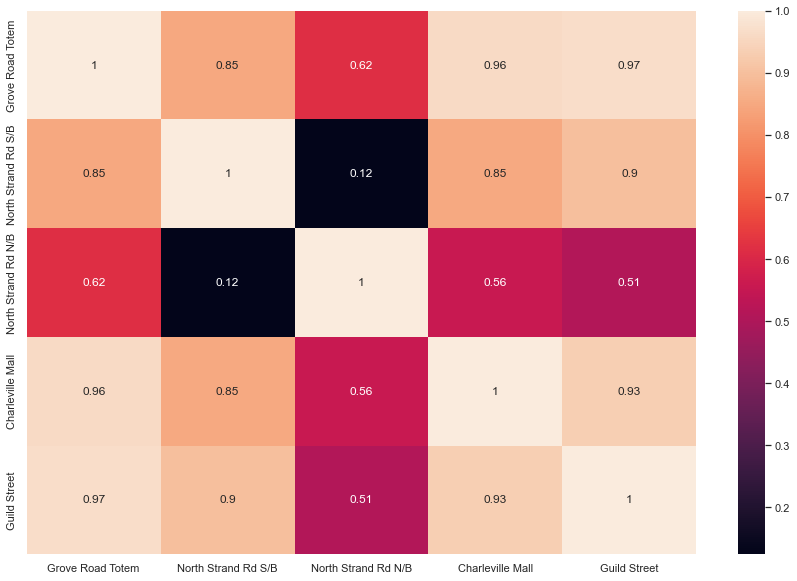

In [89]:
sns.heatmap(cycleHour.corr(), annot=True);

# Merge Datasets

In [90]:
# Training and testing dataset
df = pd.merge_asof(pedCount, cycleCount, on='date')
df = pd.merge_asof(df, hourlyWeather, on='date')
df

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl
0,2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10
1,2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10
2,2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90
3,2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50
4,2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80
17540,2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60
17541,2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10
17542,2020-12-31 22:00:00,149.00,142.00,NaN,NaN,162.00,179.00,478.00,886.00,120.00,NaN,1024.00,92.00,10.00,139.00,213.00,35.00,66.00,168.00,82.00,44.00,62.00,35.00,24.00,7.00,9.00,3.00,15.00,0.00,4.40,2.90,7.50,89.00,1011.80


In [94]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17544 entries, 0 to 17543
Data columns (total 34 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   date                                             17544 non-null  datetime64[ns]
 1   O'Connell St Outside Pennys                      17543 non-null  float64       
 2   O'Connell St Outside Clerys                      17543 non-null  float64       
 3   Mary Street                                      12191 non-null  float64       
 4   Capel Street                                     8760 non-null   float64       
 5   Aston Quay                                       17543 non-null  float64       
 6   Grafton Street @ CompuB                          17543 non-null  float64       
 7   Talbot Street North                              17543 non-null  float64       
 8   Doilier Street, Burgh Quay          

In [92]:
df.isna().sum()

date                                                  0
O'Connell St Outside Pennys                           1
O'Connell St Outside Clerys                           1
Mary Street                                        5353
Capel Street                                       8784
Aston Quay                                            1
Grafton Street @ CompuB                               1
Talbot Street North                                   1
Doilier Street, Burgh Quay                            1
Dawson Street Replacement                             1
Dame Street                                        8784
Talbot Street South                                   1
O'Connell St, Parnell St @ AIB                        1
Grafton Street / Nassau Street / Suffolk Street       1
College Green, Bank Of Ireland                        1
Henry Street                                        853
Westmoreland Street East                              1
Liffey Street                                   

In [93]:
zeroCount(df)

date                                               0.00
O'Connell St Outside Pennys                        0.48
O'Connell St Outside Clerys                        0.32
Mary Street                                        0.83
Capel Street                                       0.17
Aston Quay                                         8.12
Grafton Street @ CompuB                            9.84
Talbot Street North                                8.59
Doilier Street, Burgh Quay                         7.98
Dawson Street Replacement                         45.74
Dame Street                                        8.09
Talbot Street South                                8.25
O'Connell St, Parnell St @ AIB                    10.63
Grafton Street / Nassau Street / Suffolk Street    9.46
College Green, Bank Of Ireland                     8.35
Henry Street                                      11.11
Westmoreland Street East                           0.91
Liffey Street                                   

In [91]:
# Validation Dataset
df2021 = pd.merge_asof(pedCount2021, cycleCount2021, on='date')
df2021 = pd.merge_asof(df2021, hourlyWeather, on='date')
df2021

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl
0,2021-01-01 00:00:00,137.00,125.00,NaN,NaN,165.00,111.00,525.00,793.00,45.00,NaN,375.00,85.00,9.00,163.00,227.00,33.00,43.00,220.00,94.00,66.00,52.00,27.00,5.00,0.00,2.00,0.00,3.00,0.00,4.70,2.80,7.50,88.00,1012.90
1,2021-01-01 01:00:00,53.00,51.00,NaN,NaN,25.00,42.00,1204.00,448.00,10.00,NaN,137.00,29.00,2.00,66.00,64.00,22.00,28.00,112.00,26.00,18.00,12.00,18.00,4.00,0.00,1.00,0.00,2.00,0.00,4.60,2.70,7.40,87.00,1013.40
2,2021-01-01 02:00:00,49.00,38.00,NaN,NaN,27.00,25.00,1837.00,262.00,8.00,NaN,210.00,28.00,4.00,40.00,52.00,17.00,32.00,44.00,24.00,11.00,14.00,6.00,7.00,0.00,0.00,0.00,1.00,0.00,4.30,2.70,7.40,89.00,1013.80
3,2021-01-01 03:00:00,30.00,12.00,NaN,NaN,16.00,15.00,2996.00,88.00,6.00,NaN,73.00,24.00,2.00,39.00,14.00,10.00,18.00,15.00,15.00,4.00,7.00,8.00,5.00,0.00,0.00,0.00,1.00,0.00,4.10,2.60,7.40,89.00,1014.30
4,2021-01-01 04:00:00,24.00,12.00,NaN,NaN,16.00,17.00,3621.00,40.00,11.00,NaN,86.00,18.00,0.00,14.00,24.00,2.00,12.00,23.00,0.00,10.00,5.00,6.00,6.00,2.00,0.00,3.00,2.00,0.00,3.60,2.10,7.10,89.00,1014.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2021-12-31 19:00:00,NaN,807.00,435.00,2301.00,NaN,832.00,0.00,736.00,145.00,1170.00,1347.00,600.00,139.00,1282.00,1123.00,153.00,NaN,1403.00,2394.00,893.00,504.00,239.00,57.00,14.00,29.00,8.00,0.00,0.00,13.50,9.70,12.00,77.00,1010.40
8756,2021-12-31 20:00:00,NaN,884.00,257.00,1695.00,NaN,740.00,0.00,784.00,184.00,1064.00,1468.00,503.00,144.00,1611.00,925.00,213.00,NaN,1353.00,1898.00,964.00,628.00,287.00,70.00,16.00,26.00,5.00,0.00,0.00,13.30,9.80,12.10,79.00,1010.00
8757,2021-12-31 21:00:00,NaN,513.00,108.00,1666.00,NaN,413.00,0.00,499.00,75.00,863.00,1330.00,269.00,87.00,1253.00,524.00,132.00,NaN,716.00,1491.00,945.00,319.00,168.00,44.00,18.00,21.00,6.00,0.00,0.00,13.20,9.90,12.20,80.00,1009.40
8758,2021-12-31 22:00:00,NaN,385.00,109.00,1279.00,NaN,344.00,0.00,357.00,43.00,668.00,1522.00,181.00,53.00,841.00,1401.00,86.00,NaN,543.00,1428.00,690.00,225.00,106.00,19.00,2.00,11.00,3.00,0.00,0.00,14.40,11.40,13.50,82.00,1009.80


In [96]:
df2021.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8760 entries, 0 to 8759
Data columns (total 34 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   date                                             8760 non-null   datetime64[ns]
 1   O'Connell St Outside Pennys                      3640 non-null   float64       
 2   O'Connell St Outside Clerys                      8759 non-null   float64       
 3   Mary Street                                      4488 non-null   float64       
 4   Capel Street                                     4488 non-null   float64       
 5   Aston Quay                                       2796 non-null   float64       
 6   Grafton Street @ CompuB                          8732 non-null   float64       
 7   Talbot Street North                              8352 non-null   float64       
 8   Doilier Street, Burgh Quay            

In [95]:
df2021.isna().sum()

date                                                  0
O'Connell St Outside Pennys                        5120
O'Connell St Outside Clerys                           1
Mary Street                                        4272
Capel Street                                       4272
Aston Quay                                         5964
Grafton Street @ CompuB                              28
Talbot Street North                                 408
Doilier Street, Burgh Quay                            1
Dawson Street Replacement                            55
Dame Street                                        4272
Talbot Street South                                   1
O'Connell St, Parnell St @ AIB                        1
Grafton Street / Nassau Street / Suffolk Street       1
College Green, Bank Of Ireland                        1
Henry Street                                          1
Westmoreland Street East                              1
Liffey Street                                   

In [97]:
zeroCount(df2021)

date                                               0.00
O'Connell St Outside Pennys                        1.50
O'Connell St Outside Clerys                        0.06
Mary Street                                        0.22
Capel Street                                       0.21
Aston Quay                                        21.50
Grafton Street @ CompuB                            0.41
Talbot Street North                               11.56
Doilier Street, Burgh Quay                         0.01
Dawson Street Replacement                          4.57
Dame Street                                        0.35
Talbot Street South                                0.00
O'Connell St, Parnell St @ AIB                     0.01
Grafton Street / Nassau Street / Suffolk Street    2.89
College Green, Bank Of Ireland                     0.23
Henry Street                                       0.01
Westmoreland Street East                           0.83
Liffey Street                                   

In [98]:
from dataprep.eda import create_report

## Daily Data

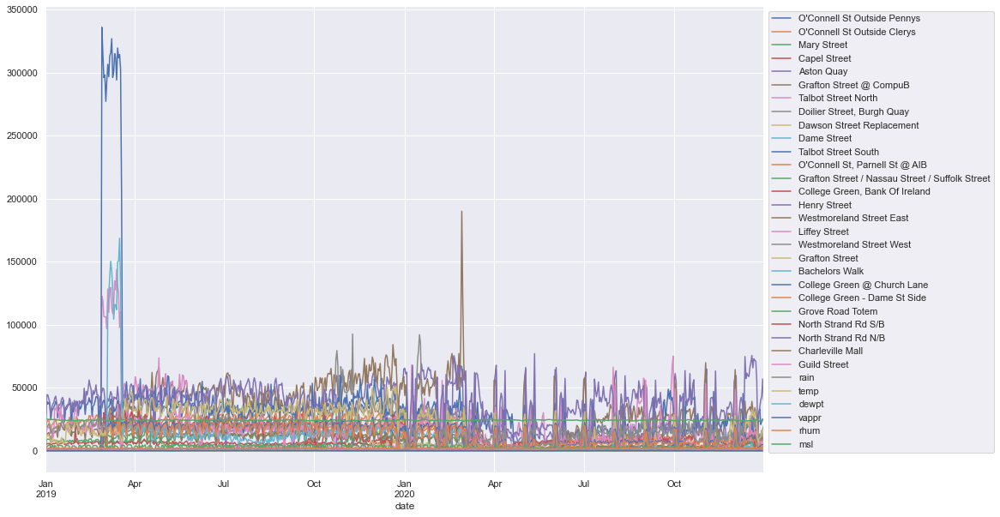

In [105]:
df.resample('D', on='date').sum().plot.line() #Look to add mean instead
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();


# Feature Engineering

## Add Day of Week and Hour of Day

In [ ]:
df['Day of Week'] = df.date.dt.dayofweek
df2021['Day of Week'] = df2021.date.dt.dayofweek
df

In [ ]:
df['Hour'] = df.date.dt.hour
df2021['Hour'] = df2021.date.dt.hour
df

## Add Months

In [ ]:
df['Month'] = df.date.dt.month
df2021['Month'] = df2021.date.dt.month
df

## Add Seasons

In [ ]:
df['Season'] = (df.date.dt.month%12 // 3  + 1)
df2021['Season'] = (df2021.date.dt.month%12 // 3  + 1)
df

## Total Counts

In [ ]:
df['Cycle Total'] = df[['North Strand Rd S/B','North Strand Rd N/B', 'Charleville Mall',
        'Guild Street']].sum(axis=1)
df['Pedestrian Total'] = df[["O'Connell St Outside Pennys",
       "O'Connell St Outside Clerys",'Talbot Street North', 
        'Talbot Street South',"O'Connell St, Parnell St @ AIB", 
        'Henry Street', 'Liffey Street','Bachelors Walk']].sum(axis=1)
df['Total'] = df['Cycle Total'] + df['Pedestrian Total']
df.set_index('date', inplace=True)
df

In [ ]:
df2021['Cycle Total'] = df2021[['North Strand Rd S/B','North Strand Rd N/B', 'Charleville Mall',
        'Guild Street']].sum(axis=1)
df2021['Pedestrian Total'] = df2021[["O'Connell St Outside Pennys",
       "O'Connell St Outside Clerys",'Talbot Street North', 
        'Talbot Street South',"O'Connell St, Parnell St @ AIB", 
        'Henry Street', 'Liffey Street','Bachelors Walk']].sum(axis=1)
df2021['Total'] = df2021['Cycle Total'] + df2021['Pedestrian Total']
df2021.set_index('date', inplace=True)

df2021

## Add Moving Average

In [ ]:
rollHours = 6
df[str(rollHours) + ' Hour Cycle Moving Average'] = df['Cycle Total'].rolling(rollHours).mean()
df[str(rollHours) + ' Hour Pedestrian Moving Average'] = df['Pedestrian Total'].rolling(rollHours).mean()
df

In [ ]:
rollHours = 6
df2021[str(rollHours) + ' Hour Cycle Moving Average'] = df2021['Cycle Total'].rolling(rollHours).mean()
df2021[str(rollHours) + ' Hour Pedestrian Moving Average'] = df2021['Pedestrian Total'].rolling(rollHours).mean()
df2021

## Check Missing Values

In [ ]:
df.isna().sum()

## Add Ratios

In [ ]:
df['Pedestrian to Cyclist Ratio'] = df['Pedestrian Total'].values / df['Cycle Total'].values
df['Pedestrian to Cyclist Ratio'].replace([np.inf, -np.inf], method='bfill', inplace=True)
#df.drop(columns=['Cycle Total', 'Pedestrian Total'],inplace=True)

In [ ]:
df2021['Pedestrian to Cyclist Ratio'] = df2021['Pedestrian Total'].values / df2021['Cycle Total'].values
df2021['Pedestrian to Cyclist Ratio'].replace([np.inf, -np.inf], method='bfill', inplace=True)

In [ ]:
df.isin([np.inf, -np.inf]).sum()

In [ ]:
df.isna().sum()

## Sums of Data

In [ ]:
dfSums = df[['rain', 'temp', 'Day of Week', 'Hour','Month','Season','Cycle Total','Pedestrian Total']]
dfSums

### Sums Daily

In [ ]:
dfSums.reset_index(inplace=True)
dfSumsDaily = dfSums.resample('D', on='date').agg({'rain':'sum', 'temp':'mean', 'Day of Week':'last', 'Hour':'last','Month':'last','Season':'last',
 'Cycle Total':'sum','Pedestrian Total':'sum'})
dfSumsDaily

In [ ]:
dfSumsDaily[['Month', 'Cycle Total', 'Pedestrian Total', 'Season']]

In [ ]:
sns.barplot(data=dfSumsDaily[['Month', 'Cycle Total', 'Pedestrian Total', 'Season']], 
            x=dfSumsDaily.index, y='Cycle Total');

In [ ]:
sns.displot(data=dfSumsDaily[['Month', 'Cycle Total', 'Pedestrian Total', 'Season']], 
            x="Pedestrian Total", col='Season', hue='Season');

### Daily Correlations

In [ ]:
sns.pairplot(data=dfSumsDaily);

### Daily Distributions

In [ ]:
sns.jointplot(data=dfSumsDaily[['Pedestrian Total','temp']], x='Pedestrian Total', y='temp');

In [ ]:
dfSumsDaily[['rain', 'temp','Cycle Total',
       'Pedestrian Total']].plot(kind='density', subplots=True, figsize=(10,15));

In [ ]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=dfSumsDaily[['rain', 'temp','Cycle Total',
       'Pedestrian Total']], orient='h', palette='Accent_r');

### Distribution Comparisons

In [ ]:
sns.jointplot(data=dfSumsDaily[['Pedestrian Total','temp']], x='Pedestrian Total', y='temp')
plt.xticks(rotation=90)
plt.show();

In [ ]:
sns.jointplot(data=dfSumsDaily[['Cycle Total','temp']], x='Cycle Total', y='temp');

In [ ]:
sns.jointplot(data=dfSumsDaily[['Pedestrian Total','rain']], x='Pedestrian Total', y='rain');

In [ ]:
sns.jointplot(data=dfSumsDaily[['Cycle Total','rain']], x='Cycle Total', y='rain');

In [ ]:
sns.set(rc={'figure.figsize':(15,10)})
sns.violinplot(data=dfSumsDaily[['rain', 'temp','Cycle Total',
       'Pedestrian Total']], scale='width', palette='Set2', #orient='h',
              cut=0);# Cut at my domain no negative count

In [ ]:
sns.relplot(data=dfSumsDaily[['Cycle Total','temp']], x='Cycle Total', y='temp',size='temp');

In [ ]:
sns.relplot(data=dfSumsDaily[['Cycle Total','temp']], x='temp', y='Cycle Total',size='Cycle Total');

In [ ]:
sns.relplot(data=dfSumsDaily[['Cycle Total','rain']], x='Cycle Total', y='rain',size='rain');

In [ ]:
sns.relplot(data=dfSumsDaily[['Cycle Total','rain']], x='rain', y='Cycle Total',size='Cycle Total');

In [ ]:
sns.relplot(data=dfSumsDaily[['Pedestrian Total','temp']], x='temp', y='Pedestrian Total',size='Pedestrian Total');

In [ ]:
sns.relplot(data=dfSumsDaily[['Pedestrian Total','temp']], x='Pedestrian Total', y='temp',size='temp');

In [ ]:
sns.relplot(data=dfSumsDaily[['Pedestrian Total','rain']], x='Pedestrian Total', y='rain',size='rain');

In [ ]:
sns.relplot(data=dfSumsDaily[['Pedestrian Total','rain']], x='rain', y='Pedestrian Total',size='Pedestrian Total');

In [ ]:
dfSumsDaily.describe()

### Line Plots of Daily Sums

In [ ]:
dfSumsDaily[['Cycle Total', 'Pedestrian Total']].plot();

In [ ]:
dfSumsDaily[['Cycle Total', 'Pedestrian Total']].pct_change().cumsum().plot();

In [ ]:
np.log(dfSumsDaily[['Cycle Total', 'Pedestrian Total']].pct_change().cumsum()).plot();

In [ ]:
df.info()

# Machine Learning

## Data Prep Class

In [ ]:
class dataPrep():
    def __init__(self, data, splitSize, scale, label):
        self.label = label
        self.data = data
        self.splitSize = splitSize
        self.scale = scale
        self.yData = self.data[self.label]
        self.XData = self.data
        
    def imputeData(self, impute):
        if impute == 'KNN':
            imputer = KNNImputer(n_neighbors=3)
            impute = imputer.fit_transform(self.data)
            df = pd.DataFrame(impute, columns=self.data.columns)
        elif impute == 'Pandas':
            df = self.data.fillna(method='bfill')
            if df.isnull().values.any():
                df = df.fillna(method='ffill')
        self.data = df
        self.XData = df
        return df
    
    def scaleData(self):
        scaler = StandardScaler()
        self.XData = self.data
        scaled = scaler.fit(self.XData)
        data_scaled = scaled.fit_transform(self.XData)
        self.XData = data_scaled
        return scaled
        
    def splitData(self):
        X_train, X_test, y_train, y_test = train_test_split(self.XData, self.yData, test_size= self.splitSize, shuffle=False)
        return X_train, X_test, y_train, y_test

## Machine Learning Model Class

In [ ]:
class mLModel():
    def __init__(self, params, cv, model, data, splitSize, 
                 inputScaler, label, imputer):
        self.params = params
        self.cv = cv
        self.imputer = imputer
        self.model = model
        self.data = data
        self.splitSize = splitSize
        self.scale = inputScaler
        self.label = label
        self.fittedModel = None
        self.bestParams = None
        
    def transformData(self):
        dataT = dataPrep(self.data, self.splitSize, self.scale, self.label)
        data = dataT.imputeData(self.imputer)
        self.data = data
        if self.scale == 'Standard':
            scaledData = dataT.scaleData()
            X_train, X_test, y_train, y_test = dataT.splitData()
            return X_train, X_test, y_train, y_test
        else:
            X_train, X_test, y_train, y_test = dataT.splitData()
            return X_train, X_test, y_train, y_test
    
    def createModel(self):
        if self.model == 'Ridge':
            model = RandomizedSearchCV(estimator=Ridge(), param_distributions=self.params,
                n_iter = 20, cv = self.cv, verbose=2, n_jobs=-1, return_train_score=True, refit=True)
        if self.model == 'RandomForest':
            model = RandomizedSearchCV(estimator=RandomForestRegressor(), param_distributions=self.params, 
                            n_iter = 20, cv = self.cv, verbose=2, n_jobs=-1, 
                                return_train_score=True, refit=True)
        if self.model == 'KNN':
            model = RandomizedSearchCV(estimator=KNeighborsRegressor(), param_distributions=self.params,
                n_iter = 20, cv = self.cv, verbose=2, n_jobs=-1, return_train_score=True, refit=True)
        return model
    
    def fitModel(self, model, X_train, y_train):
        fitMod = model.fit(X_train, y_train)
        self.bestParams = fitMod.best_params_
        self.fittedModel = fitMod
        self.score = fitMod.best_score_
        return fitMod
    
    def getMetrics(self, X_train, X_test, y_train, y_test, lossFunction):
        r2 = []
        mse = []
        mae = []
        predTrain = self.fittedModel.predict(X_train)
        predTest = self.fittedModel.predict(X_test)
        for loss in lossFunction:
            if loss == mean_squared_error:
                mse.append(mean_squared_error(y_train, predTrain))
                mse.append(mean_squared_error(y_test, predTest))
            elif loss == r2_score:
                r2.append(r2_score(y_train, predTrain))
                r2.append(r2_score(y_test, predTest))
            if loss == mean_absolute_error:
                mae.append(mean_absolute_error(y_train, predTrain))
                mae.append(mean_absolute_error(y_test, predTest))    
                
        results = pd.DataFrame()
        results['Data Set'] = ['Train','Test']
        results['Label'] = self.label
        results['Scaled'] = self.scale
        results['Imputer'] = self.imputer
        results['Split'] = self.splitSize
        results['MSE'] = mse
        results['MAE'] = mae
        results['R2'] = r2
        results['Model'] = self.model
        results['Best Params'] = str(self.bestParams)
        results['feature importance'] = 'Not Available'
        if self.model == 'RandomForest':
            results.at[0,'feature importance'] = self.fittedModel.best_estimator_.feature_importances_.astype('object')
            results.at[1,'feature importance'] = self.fittedModel.best_estimator_.feature_importances_.astype('object')
        return predTrain, predTest, results
    
    def visualizeResults(self, period, y_test, predTest):
        x_ax = range(len(y_test[:period]))
        plt.scatter(x_ax, y_test[:period], s=5, color="blue", label="original")
        plt.plot(x_ax, predTest[:period], lw=0.8, color="red", label="predicted")
        plt.legend()
        plt.show()

## Loss Functions

In [ ]:
lossFunction = [mean_squared_error, mean_absolute_error, r2_score] 
totalResults = pd.DataFrame()

## Model Parameters

In [ ]:
# Random Forest Model Parameters
rfParams = {'bootstrap': [True, False], 
          'max_depth': [10, 20, 100], 
          'max_features': ['sqrt', 'log2'], 
          'n_estimators': [10, 50, 100, 500, 1000, 2000]}

# Ridge Model Parameters
ridgeParams = {'alpha': [0.001, 0.01, 0.1, 1, 5, 10], 
          'normalize': [True, False]}

# Lasso Model Parameters
knnParams = {'n_neighbors': [2, 3, 5, 7, 10], 
          'leaf_size': [20, 30, 40, 50],
              'p': [1, 2]}

## Create and Fit Models

In [ ]:
count = 1
total = len(predict) * len(scalers) * len(imputers) * len(models) * len(splitSizes)
for mod in models:
    for pre in predict:
        for sca in scalers:
            for spl in splitSizes:
                for imp in imputers:
                    data = df.copy()
                    valData = df2021.copy()
                    if mod == 'KNN':
                        p = knnParams
                    elif mod == 'Ridge':
                        p = ridgeParams
                    elif mod == 'RandomForest':
                        p = rfParams
                    if pre == 'Cycle Total':
                        data.drop(columns=['Grove Road Totem', 'North Strand Rd S/B',
                                           'North Strand Rd N/B', 'Charleville Mall', 'Guild Street'], 
                                  axis=1, inplace=True)
                        valData.drop(columns=['Grove Road Totem', 'North Strand Rd S/B',
                                           'North Strand Rd N/B', 'Charleville Mall', 'Guild Street'], 
                                  axis=1, inplace=True)
                    elif pre == 'Pedestrian Total':
                        data.drop(columns=["O'Connell St Outside Pennys", "O'Connell St Outside Clerys",'Aston Quay', 
                                           'Grafton Street @ CompuB', 'Talbot Street North', 'Doilier Street, Burgh Quay', 
                                           'Dawson Street Replacement', 'Talbot Street South', 
                                           "O'Connell St, Parnell St @ AIB", 'Grafton Street / Nassau Street / Suffolk Street',
                                           'College Green, Bank Of Ireland', 'Henry Street', 'Westmoreland Street East', 
                                           'Liffey Street', 'Westmoreland Street West', 'Grafton Street', 'Bachelors Walk',
                                           'College Green @ Church Lane', 'College Green - Dame St Side'],
                                  axis=1, inplace=True)
                        valData.drop(columns=["O'Connell St Outside Pennys", "O'Connell St Outside Clerys",'Aston Quay', 
                                           'Grafton Street @ CompuB', 'Talbot Street North', 'Doilier Street, Burgh Quay', 
                                           'Dawson Street Replacement', 'Talbot Street South', 
                                           "O'Connell St, Parnell St @ AIB", 'Grafton Street / Nassau Street / Suffolk Street',
                                           'College Green, Bank Of Ireland', 'Henry Street', 'Westmoreland Street East', 
                                           'Liffey Street', 'Westmoreland Street West', 'Grafton Street', 'Bachelors Walk',
                                           'College Green @ Church Lane', 'College Green - Dame St Side'],
                                  axis=1, inplace=True)
                    
                    # Create machine learning class
                    randomSearch = mLModel(params=p, cv=5, model=mod,
                                                       data=data, splitSize=spl, inputScaler=sca, 
                                                label=pre, imputer=imp)
                    # Split the dataset
                    X_train, X_test, y_train, y_test = randomSearch.transformData()
                    
                    # Create the model 
                    model = randomSearch.createModel()

                    # Fit the model and test 
                    randomSearch.fitModel(model, X_train, y_train)
                    
                    # Get metrics
                    predTrain, predTest, results = randomSearch.getMetrics(X_train, X_test, y_train,
                                                                y_test, lossFunction)
                    
                    dataX = dataPrep(valData, spl, sca, pre)
                    dataX.imputeData(imp)
                    dataX.scaleData()
                    
                    pred2021 = randomSearch.fittedModel.predict(dataX.XData)
                    
                    y = valData[[pre]]
                    results.loc[len(results.index)] = ['Validation Data', pre, sca, imp, spl, 
                                                       mean_squared_error(y, pred2021),
                        mean_absolute_error(y, pred2021),r2_score(y, pred2021), mod, 'NA', 'NA']
                    totalResults = pd.concat([totalResults, results], axis=0)
                    
                    print('Completed {}%'.format(round((count / total)*100,2)))
                    count += 1

# All Results

In [ ]:
totalResults[(totalResults.R2 > 0.7) & (totalResults['Data Set'] == 'Validation Data')]

In [ ]:
totalResults.to_csv('TotalResults242022.csv', index=False)

dataVal = df2021.copy()
dataX = dataPrep(dataVal, spl, sca, pre)
dataX.imputeData(imp)

dataX.data.drop(columns=['Grove Road Totem', 'North Strand Rd S/B',
                   'North Strand Rd N/B', 'Charleville Mall', 'Guild Street'], 
          axis=1, inplace=True)

dataX.scaleData()

y = dataVal[[pre]]

pred2021 = randomSearch.fittedModel.predict(dataX.XData)

r2_score(y, pred2021)

results.loc[len(results.index)] = ['Validation Data', pre, sca, imp, spl, mean_squared_error(y, pred2021),
    mean_absolute_error(y, pred2021),r2_score(y, pred2021), mod, 'NA', 'NA']
results

results = pd.read_csv('TotalResults2632022.csv')
results

In [ ]:
#results2 = pd.read_csv('TotalResults2732022.csv') 
#results2
